# Deep Learning with PyTorch

In [1]:
# imports
import torch
import numpy
import cv2

In [2]:
# Check whether CUDA is available
if torch.cuda.is_available():
    print("CUDA Available")
else:
    print("CUDA Unavailable")

CUDA Available


## 2.1 张量基础

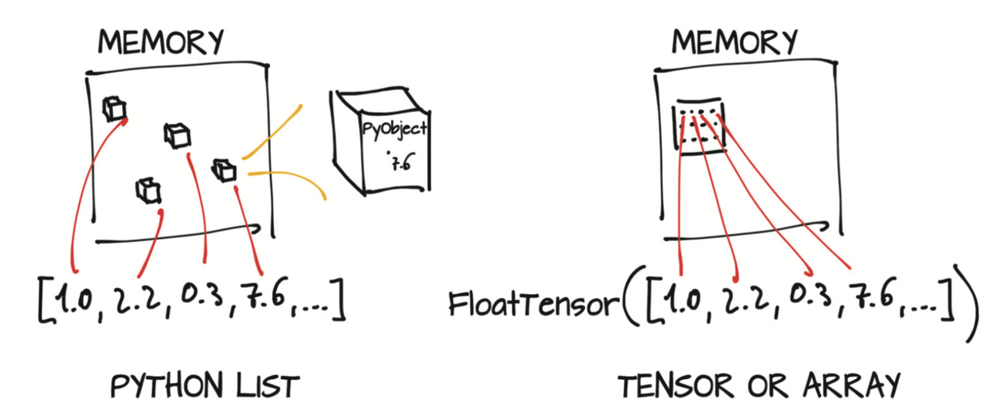

In [3]:
# Tensor Tests
tensor_a = torch.ones(3)
print(tensor_a) # tensor([1., 1., 1.])
print(tensor_a[1]) # tensor(1.)
print(float(tensor_a[1])) # 1.0
# Modify the tensor
tensor_a[2] = 2.0
print(tensor_a) # tensor([1., 1., 2.])
# Initialize the tensor as zeros
tensor_b = torch.zeros(6)
print(tensor_b) # tensor([0., 0., 0., 0., 0., 0.])
# Initialize the tensor with py list
tensor_c = torch.tensor([1.0, 4.0, 2.0, 1.0])
print(tensor_c) # tensor([1., 4., 2., 1.])
print(tensor_c.shape)
# Two-Dimensional Tensors
tensor_d = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
print(tensor_d)
print(tensor_d.shape)
print(tensor_d[0][1])
print(tensor_d[0, 1])
print(tensor_d[0])
tensor_e = torch.zeros(3, 3)
print(tensor_e)

tensor([1., 1., 1.])
tensor(1.)
1.0
tensor([1., 1., 2.])
tensor([0., 0., 0., 0., 0., 0.])
tensor([1., 4., 2., 1.])
torch.Size([4])
tensor([[1., 4.],
        [2., 1.],
        [3., 5.]])
torch.Size([3, 2])
tensor(4.)
tensor(4.)
tensor([1., 4.])
tensor([[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]])


## 2.2 张量与储存

在本节中，我们将开始了解关于内部实现的信息。数值分配在连续的内存块中，由`torch.Storage`实例管理。存储（`Storage`）是一个一维的数值数据数组，例如一块包含了指定类型（可能是float或int32）数字的连续内存块。PyTorch的张量（`Tensor`）就是这种存储（`Storage`）的视图（view），我们可以使用偏移量和每一维的跨度索引到该存储中。

多个张量可以索引同一存储，即使它们的索引方式可能不同，如图2.4所示。 实际上，当你在上节最后一个代码片段中获取`points[0]`时，你得到的是另一个张量，该张量与`points`索引相同的存储，只是不是索引该存储的全部并且具有不同的维数（一维与二维）。由于基础内存仅分配一次，所以无论`Storage`实例管理的数据大小如何，都可以快速地在该数据上创建不同的张量视图。
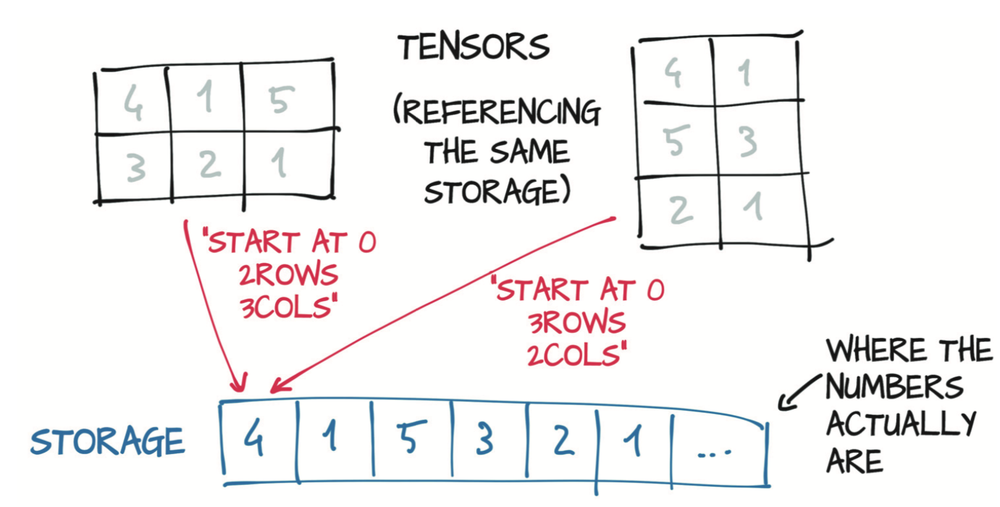

In [4]:
# Tensor Storage Tests
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
points_storage = points.storage()
print(points_storage)
print(points_storage[0], points_storage[3])
# Modify the value in storage will also result in the change of tensor value
points_storage[0] = 2.0
print(points)

 1.0
 4.0
 2.0
 1.0
 3.0
 5.0
[torch.FloatStorage of size 6]
1.0 1.0
tensor([[2., 4.],
        [2., 1.],
        [3., 5.]])


## 2.3 Offset, Size & Stride

除了存放存储外，为了索引存储，张量依赖于几条明确定义它们的信息：尺寸（size）、存储偏移（storage offset）和步长（stride），如图2.5所示。尺寸（或按照NumPy中的说法：形状shape）是一个元组，表示张量每个维度上有多少个元素。存储偏移是存储中与张量中的第一个元素相对应的索引。步长是在存储中为了沿每个维度获取下一个元素而需要跳过的元素数量。
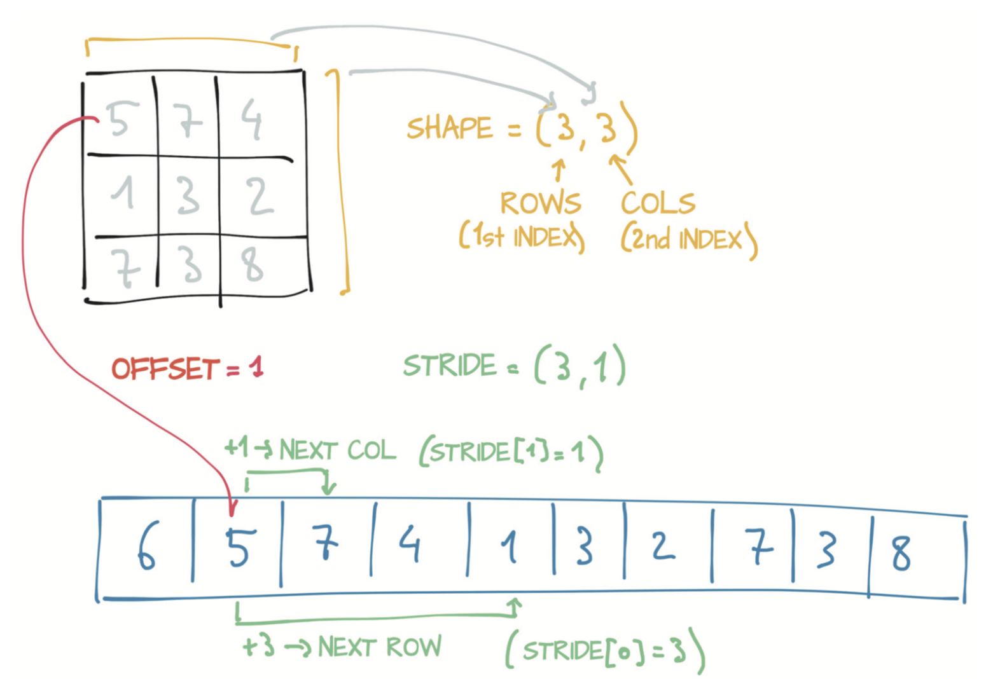

In [5]:
# Offset
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1]
print(second_point.storage_offset())
second_element = points[0][1]
print(second_element.storage_offset())

2
1


In [6]:
# Size
print(points.size())

torch.Size([3, 2])


In [7]:
# Stride
print(points.stride())
points = torch.zeros(5, 5, 5)
print(points)
print(points.stride())
points = torch.ones(4, 3, 2, 2)
print(points)
print(points.stride())

(2, 1)
tensor([[[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]],

        [[0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0.]]])
(25, 5, 1)
tensor([[[[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]]],


        [[[1., 1.],
          [1., 1.]],

         [[1., 1.],
       

In [8]:
# Sub-tensor's size, offset & stride
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1]

print(second_point.size())
print(second_point.storage_offset())
print(second_point.stride())

torch.Size([2])
2
(1,)


In [9]:
# Modify the Sub-tensor will also result in the change of the mother tensor
second_point[0] = 10.0
print(points)
"""
If we don't want these things to happen, 
in another word, we want them to be different objects, 
which have completely different address in RAM, 
we have to clone the tensor as the following codes demonstrate:
"""
points = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 5.0]])
second_point = points[1].clone()
second_point[0] = 10.0
print(points)

tensor([[ 1.,  4.],
        [10.,  1.],
        [ 3.,  5.]])
tensor([[1., 4.],
        [2., 1.],
        [3., 5.]])


In [10]:
# Now, we may introduce the transpose of tensors
# Similar to matrix.T in numpy
points_t = points.t()
print("Transpose Matrix:")
print(points_t)
# They share the same storage in RAM:
if id(points.storage()) == id(points_t.storage()):
    print("Identical Storage")
else: print("Not Identical Storage")
    
print(points.stride())
print(points_t.stride())

Transpose Matrix:
tensor([[1., 2., 3.],
        [4., 1., 5.]])
Identical Storage
(2, 1)
(1, 2)


在PyTorch中进行转置不仅限于矩阵（即二维数组）。以翻转三维数组的步长和尺寸为例，你可以通过指定应需要转置的两个维度来转置多维数组：

In [11]:
some_tensor = torch.ones(3, 4, 5)
some_tensor, some_tensor.shape, some_tensor.stride()

(tensor([[[1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.]],
 
         [[1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.]],
 
         [[1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.],
          [1., 1., 1., 1., 1.]]]),
 torch.Size([3, 4, 5]),
 (20, 5, 1))

In [12]:
some_tensor_t = some_tensor.transpose(0, 2)
some_tensor_t, some_tensor_t.shape, some_tensor_t.stride()

(tensor([[[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]],
 
         [[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]]]),
 torch.Size([5, 4, 3]),
 (1, 5, 20))

从最右边的维开始将其值存放在存储中的张量（例如沿着行存放在存储中的二维张量）定义为连续（Contiguous）张量。连续张量很方便，因为你可以高效且有序地访问它们的元素而不是在存储中四处跳跃访问。（由于现代CPU中内存访问的工作原理，改善数据局部性可提高性能。译者注：即连续张量满足局部性原理）

在前例中，`points`是连续的，但其转置不是：

In [13]:
points.is_contiguous(), points_t.is_contiguous(), points_t.storage()

(True,
 False,
  1.0
  4.0
  2.0
  1.0
  3.0
  5.0
 [torch.FloatStorage of size 6])

我们可以讲转置的不连续的tensor变成连续的

In [14]:
points_t = points.t()
points_t_cont = points_t.contiguous()
points_t.is_contiguous(), points_t_cont.is_contiguous()

(False, True)

In [15]:
points_t.stride(), points_t_cont.stride()

((1, 2), (3, 1))

In [16]:
points_t_cont.storage()

 1.0
 2.0
 3.0
 4.0
 1.0
 5.0
[torch.FloatStorage of size 6]

## 2.4 数据类型

数据类型指定张量可以容纳的可能值（整数还是浮点数）以及每个值的字节数。`dtype`参数被故意设计成类似于同名的标准NumPy参数。以下是`dtype`参数的可能取值的列表：

* `torch.float32`或`torch.float` —— 32位浮点数
* `torch.float64`或`torch.double` —— 64位双精度浮点数 
* `torch.float16`或`torch.half` —— 16位半精度浮点数
* `torch.int8` —— 带符号8位整数
* `torch.uint8` —— 无符号8位整数
* `torch.int16`或`torch.short` —— 带符号16位整数
* `torch.int32`或`torch.int` —— 带符号32位整数
* `torch.int64`或`torch.long` —— 带符号64位整数

每个`torch.float`、`torch.double`等等都有一个与之对应的具体类：`torch.FloatTensor`、`torch.DoubleTensor`等等。`torch.int8`对应的类是`torch.CharTensor`，而`torch.uint8`对应的类是`torch.ByteTensor`。`torch.Tensor`是`torch.FloatTensor`的别名，即默认数据类型为32位浮点型。

想要分配正确数字类型的张量，你可以指定合适的`dtype`作为张量构造函数的参数，如下所示：

In [17]:
double_points = torch.ones(10, 2, dtype=torch.double)
short_points = torch.tensor([[1, 2], [3, 4]], dtype=torch.short)
short_points.dtype

torch.int16

In [18]:
# Convert to double / short
double_points = torch.zeros(10, 2).double()
short_points = torch.ones(10, 2).short()
double_points = torch.zeros(10, 2).to(torch.double)
short_points = torch.ones(10, 2).to(dtype=torch.short)

在实现内部，type和to执行相同的操作，即“检查类型如果需要就转换（check-and-convert-if-needed）”，但是to方法可以使用其他参数。

你始终可以使用type方法将一种类型的张量转换为另一种类型的张量：

In [19]:
points = torch.randn(5, 2)
print(points)
short_points = points.type(torch.short)
print(short_points)

tensor([[ 0.7397,  1.1219],
        [ 0.8060, -0.5480],
        [-1.2128,  0.5835],
        [-0.6379,  0.1224],
        [ 1.3805,  0.1563]])
tensor([[ 0,  1],
        [ 0,  0],
        [-1,  0],
        [ 0,  0],
        [ 1,  0]], dtype=torch.int16)


## 2.5 索引张量

In [20]:
points[1:]    # 第1行及之后所有行，（默认）所有列

tensor([[ 0.8060, -0.5480],
        [-1.2128,  0.5835],
        [-0.6379,  0.1224],
        [ 1.3805,  0.1563]])

In [21]:
points[1:, :] # 第1行及之后所有行，所有列

tensor([[ 0.8060, -0.5480],
        [-1.2128,  0.5835],
        [-0.6379,  0.1224],
        [ 1.3805,  0.1563]])

In [22]:
points[1:, 0] # 第1行及之后所有行，仅第0列

tensor([ 0.8060, -1.2128, -0.6379,  1.3805])

## 2.6 与NumPy的互通性

In [23]:
# tensor 与 numpy
points = torch.ones(3, 4)
points_np = points.numpy()
points_np

array([[1., 1., 1., 1.],
       [1., 1., 1., 1.],
       [1., 1., 1., 1.]], dtype=float32)

它返回尺寸、形状和数值类型正确的NumPy多维数组。有趣的是，返回的数组与张量存储共享一个基础缓冲区。因此，只要数据位于CPU RAM中，numpy方法就可以几乎零花费地高效执行，并且修改得到的NumPy数组会导致原始张量发生变化。

如果在GPU上分配了张量，（调用numpy方法时）PyTorch会将张量的内容复制到在CPU上分配的NumPy数组中。

相反，你可以通过以下方式从NumPy数组创建PyTorch张量：

In [24]:
points = torch.from_numpy(points_np)
points

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])

## 2.7 序列化张量

In [25]:
# 储存tensor
print(points)
torch.save(points, './data/chapter2/outpoints.t')
# Equivalent to the following codes:
with open('./data/chapter2/outpoints.t', 'wb') as f:
    torch.save(points, f)
f.close()

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])


In [26]:
# 读取tensor
points = torch.load('./data/chapter2/outpoints.t')
print(points)
# Equivalent to the following codes:
with open('./data/chapter2/outpoints.t', 'rb') as f:
    points = torch.load(f)
    print(points)
f.close()

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])
tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]])


如果只想通过PyTorch加载张量，则上述例子可让你快速保存张量，但这个文件格式本身是不互通（interoperable）的，你无法使用除PyTorch外其他软件读取它。根据实际使用情况，上述情况可能问题不大，但应该学习一下如何在有的时候（即想用其他软件读取的时候）互通地保存张量。尽管实际情况都是独一无二的，但当你想将PyTorch引入已经依赖于不同库的现有系统中时，上述情况会很常见；而全新的项目可能不需要经常互通地保存张量。

对于需要（互通）的情况，你可以使用HDF5格式和库。HDF5是一种可移植的、广泛支持的格式，用于表示以嵌套键值字典形式组织的序列化多维数组。Python通过h5py库支持HDF5，该库以NumPy数组的形式接收和返回数据。

In [27]:
import h5py

f = h5py.File('./data/chapter2/ourpoints.hdf5', 'w')
dset = f.create_dataset('coords', data=points.numpy())
print(dset)
f.close()

<HDF5 dataset "coords": shape (3, 4), type "<f4">


In [28]:
f = h5py.File('./data/chapter2/ourpoints.hdf5', 'r')
dset = f['coords']
last_points = dset[1:]
print(dset)
print(last_points)
last_points = torch.from_numpy(dset[1:])
print(last_points)
last_points = torch.tensor(dset[1:])
print(last_points)
f.close()

<HDF5 dataset "coords": shape (3, 4), type "<f4">
[[1. 1. 1. 1.]
 [1. 1. 1. 1.]]
tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.]])
tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.]])


## 2.8 将张量转移到GPU上运行

PyTorch张量的最后一点是关于在GPU上计算。每一个Torch张量都可以转移到GPU上去执行快速、大规模并且可以并行的计算。在张量上执行的所有操作均由PyTorch自带的GPU特定例程执行。

> 请注意： 截止至2019年初，主要的PyTorch版本仅仅在支持CUDA的GPU上具有加速功能。PyTorch的概念验证版本（Proof-of-concept version）已经可以运行在AMD的ROCm平台上，但是从1.0版开始，尚未将全部支持合并到PyTorch中。对Google TPU的支持正在进行开发中，目前的概念验证版已在Google Colab中向公众公开。在我们写这章的时候，并未计划在其他GPU技术（例如OpenCL）上实现相应的数据结构和内核。

除了dtype之外，PyTorch张量还具有设备（device）的概念，这是在设置计算机上放张量（tensor）数据的位置。 通过为构造函数指定相应的参数，可以在GPU上创建张量：

In [29]:
points_gpu = torch.tensor([[1.0, 4.0], [2.0, 1.0], [3.0, 4.0]], device='cuda')
print(points_gpu)

tensor([[1., 4.],
        [2., 1.],
        [3., 4.]], device='cuda:0')


这段代码返回一个具有相同数值数据的新张量，但存储在GPU的RAM中，而不是常规的系统RAM中。

现在数据已经存放在本地的GPU中，当在张量上运行数字运算时，你可以看见很好的加速效果。并且，这个新GPU支持的张量的类也更改为torch.cuda.FloatTensor（一开始输入的类型为torch.FloatTensor；torch.cuda.DoubleTensor等等也存在对应关系）。在大部分样例中，基于CPU和GPU的张量都公开面向用户相同的API，这使得与繁琐数字运算过程中无关的代码的编写更加容易。

如果你的机器拥有多个GPU，你可以通过传递从零开始的整数来确定张量分配给哪个GPU，该整数标志着机器上的GPU下标：

In [30]:
points_gpu = points.to(device='cuda:0')
print(points_gpu)

tensor([[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]], device='cuda:0')


In [31]:
points = 2 * points # 在CPU上做乘法
points_gpu = 2 * points.to(device='cuda') # 在GPU上做乘法

请注意，当计算结果产生后，points_gpu的张量并不会返回到CPU。这里发生的是以下三个过程：

将points张量复制到GPU
在GPU上分配了一个新的张量，并用于存储乘法的结果
返回该GPU张量的句柄
因此，如果你还想向结果加上一个常量：

In [32]:
points_gpu = points_gpu + 4

加法仍然在GPU上执行，并且没有信息流到CPU（除非您打印或访问得到的张量）。 如果要将张量移回CPU，你需要为to方法提供一个cpu参数：

In [33]:
points_cpu = points_gpu.to(device='cpu')

你可以使用速记方法`cpu`和`cuda`代替`to`方法来实现相同的目标

In [34]:
points_gpu = points.cuda() # 默认为GPU0
points_gpu = points.cuda(0)
points_cpu = points_gpu.cpu()

值得一提的是，使用`to`方法时，可以通过提供`device`和`dtype`参数来同时更改位置和数据类型。

## 2.9 Tensor's API
本节，你将知道PyTorch张量是什么以及在内部它们如何运行。在结束本章之前，我们还会看一下PyTorch提供的张量的操作。在这里列出所有操作没什么用，取而代之的是，我们将为你提供相关API的一般感觉并展示如何在官方文档中查找相关内容。

首先，在torch模块下可进行张量上和张量之间的绝大多数操作，这些操作也可以作为张量对象的方法进行调用。例如，你可以通过torch模块使用先前遇到的transpose函数：

In [35]:
a = torch.ones(3, 2)
a_t = torch.transpose(a, 0, 1)

或者调用a张量的方法：

In [36]:
a = torch.ones(3, 2)
a_t = a.transpose(0, 1)

以上两种形式之间没有区别，可以互换使用。需要注意的是：有少量的操作仅作为张量对象的方法存在。你可以通过名称中的下划线来识别它们，例如`zero_`，下划线标识表明该方法是就地（inplace）运行的，即直接修改输入而不是创建新的输出并返回。例如，`zero_`方法会将输入的所有元素清零。任何不带下划线的方法都将保持源张量不变并返回新的张量：

In [37]:
a = torch.ones(3, 2)
a.zero_()
a

tensor([[0., 0.],
        [0., 0.],
        [0., 0.]])

In [38]:
a = torch.tensor(list(range(9)))
print(a)
b = a.view(3, 3)
print(b)
c = b[1:, 1:]
print(c)

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8])
tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])
tensor([[4, 5],
        [7, 8]])


## 3.1 表格数据

首先，我们假设样本在表格中的显示顺序是没有意义的。这与时间序列不同，这里的表是独立样本的集合，而在时间序列中，样本是在时间维度上相关的。

列可以包含数值型数据（例如特定位置的温度）或标签（例如表示样品属性的字符串，比如“蓝色”）。因此，表格数据通常不是同质的（homogeneous），不同的列有不同的类型。你可能有一列显示苹果的重量，另一列则用标签编码其颜色。

我们从有趣的东西开始：葡萄酒。葡萄酒质量数据集是可免费获得的表格数据，其中包含vinho verde（葡萄牙北部的葡萄酒）样品的化学表征以及感官质量评分。

针对此数据集可能的机器学习任务是通过化学表征来预测质量得分。不过，请放心，机器学习不会在短期内杀死葡萄酒品尝者，因为我们必须从某个地方获取训练数据！

如图3.1所示，你希望找到数据中的某一化学列与质量之间的关系。例如在此图中，你将看到质量随着硫含量减少而提高。

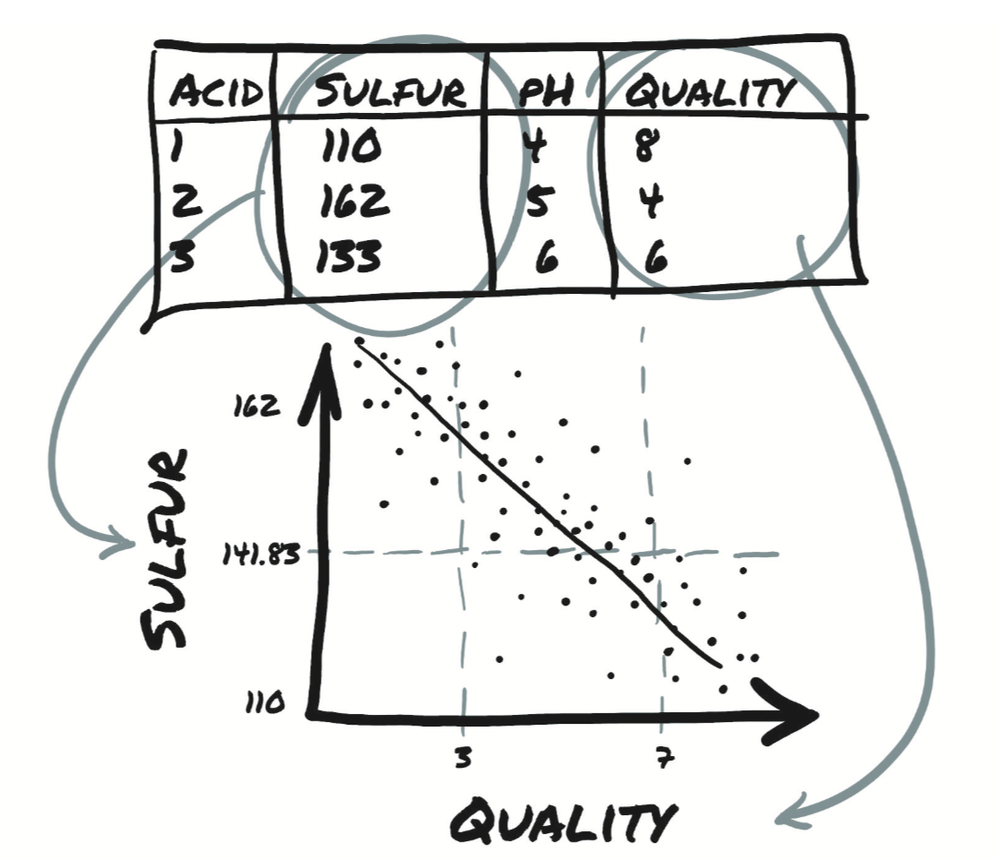


但是，在进行该观察之前，你需要一种比在文本编辑器中打开文件更有用的方式检查数据。我们将向您展示如何使用Python加载数据，然后将其转换为PyTorch张量。

Python提供了多个选项来快速加载CSV文件。三种常用的选择是

- Python自带的`csv`模块
- NumPy
- Pandas

第三个选项是最省时和最省内存的方法，但是我们将避免仅仅是加载文件就将的额外的库引入学习曲线。因为我们已经介绍了NumPy，并且PyTorch具有出色的NumPy互操作性，所以您将继续使用NumPy来加载文件并将生成的NumPy数组转换为PyTorch张量，如下面的代码所示。

In [39]:
import csv
import numpy as np
wine_path = "./data/chapter3/winequality-white.csv"
wineq_numpy = np.loadtxt(wine_path, dtype=np.float32, delimiter=";",
     skiprows=1)
wineq_numpy

array([[ 7.  ,  0.27,  0.36, ...,  0.45,  8.8 ,  6.  ],
       [ 6.3 ,  0.3 ,  0.34, ...,  0.49,  9.5 ,  6.  ],
       [ 8.1 ,  0.28,  0.4 , ...,  0.44, 10.1 ,  6.  ],
       ...,
       [ 6.5 ,  0.24,  0.19, ...,  0.46,  9.4 ,  6.  ],
       [ 5.5 ,  0.29,  0.3 , ...,  0.38, 12.8 ,  7.  ],
       [ 6.  ,  0.21,  0.38, ...,  0.32, 11.8 ,  6.  ]], dtype=float32)

在这里，你指定了二维数组的类型（32位浮点数）和用于分隔每一行各值的分隔符，并指出不应读取第一行，因为它包含列名。接下来，检查是否已读取所有数据，

In [40]:
col_list = next(csv.reader(open(wine_path), delimiter=';'))
wineq_numpy.shape, col_list

((4898, 12),
 ['fixed acidity',
  'volatile acidity',
  'citric acid',
  'residual sugar',
  'chlorides',
  'free sulfur dioxide',
  'total sulfur dioxide',
  'density',
  'pH',
  'sulphates',
  'alcohol',
  'quality'])

然后进一步将NumPy数组转成PyTorch张量：

In [41]:
import torch
wineq = torch.from_numpy(wineq_numpy)
wineq.shape, wineq.type()

(torch.Size([4898, 12]), 'torch.FloatTensor')

你可以将（葡萄酒质量分数）分数视为连续变量，视为实数，然后进行回归任务；或者将其视为标签，作为分类任务尝试从化学分析猜出该标签。在这两种方法中，往往都将分数从输入数据的张量中删除，并将其保存在单独的张量中，以便将分数用作ground truth而不将其输入到模型中。

In [42]:
data = wineq[:, :-1] # 除最后一列外所有列
data, data.shape

(tensor([[ 7.0000,  0.2700,  0.3600,  ...,  3.0000,  0.4500,  8.8000],
         [ 6.3000,  0.3000,  0.3400,  ...,  3.3000,  0.4900,  9.5000],
         [ 8.1000,  0.2800,  0.4000,  ...,  3.2600,  0.4400, 10.1000],
         ...,
         [ 6.5000,  0.2400,  0.1900,  ...,  2.9900,  0.4600,  9.4000],
         [ 5.5000,  0.2900,  0.3000,  ...,  3.3400,  0.3800, 12.8000],
         [ 6.0000,  0.2100,  0.3800,  ...,  3.2600,  0.3200, 11.8000]]),
 torch.Size([4898, 11]))

In [43]:
target = wineq[:, -1] # 最后一列
target, target.shape

(tensor([6., 6., 6.,  ..., 6., 7., 6.]), torch.Size([4898]))

如果你想将target张量转换成标签张量，那么你有两个选择，具体取决于策略或使用分类数据的方式。第一种选择是将标签视为整数向量：

In [44]:
target = wineq[:, -1].long()
target

tensor([6, 6, 6,  ..., 6, 7, 6])

如果目标是字符串标签（例如颜色），则可以采用相同的方法为每个字符串分配一个整数。

另一种选择是构建独热（one-hot）编码，即将10个分数编码成10个向量，每个向量除了一个元素为1外其他所有元素都设置为0。此时，分数1可以映射到向量
$$(1,0,0,0,0,0,0,0,0,0)$$
，分数5映射到
$$(0,0,0,0,1,0,0,0,0,0)$$
，等等。分数值与非零元素的索引相对应的事实纯属偶然；你可以打乱上述分配，从分类的角度来看，什么都不会改变。

上述两种方法有明显的区别。将葡萄酒质量分数编码成分数的整数向量中会引入了分数的可排序性，在这个例子下可能是适当的，因为分数1低于分数4。这还会在分数之间产生一定的距离（例如1和3之间的距离与2和4之间的距离相同。）如果这符合你的定量关系，那就太好了。否则，如果分数纯粹是定性的（例如颜色），则独热编码更适合，因为它不涉及隐含的顺序或距离关系。当整数之间的分数值（例如2.4）对应用没有意义时（即要么是这个值要么是那个值），单热编码才适用。

您可以使用scatter_方法来实现独热编码，该方法将源张量中的值沿作为参数提供的索引进行填充。

In [45]:
target_onehot = torch.zeros(target.shape[0], 10)
target_onehot.scatter_(1, target.unsqueeze(1), 1.0)

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

现在看一下scatter_的作用。 首先请注意，其名称下划线结尾。PyTorch中，此约定表示该方法不会返回新的张量，而是就地修改源张量。 scatter_的参数是

指定后面两个参数所处理的维度
列张量，指示要填充的索引
包含填充元素的张量或者单个标量（上例中即1.0）
换句话说，前面的调用可以这样理解：“对于每一行，获取目标标签的索引（在本例中即葡萄酒质量分数），并将其用作列索引以设置值为1.0。结果就是得到了一个编码分类信息的张量。”

scatter_的第二个参数，即索引张量，必须具有与待填充张量相同的维数。由于target_onehot是二维（4898x10）的，因此你需要使用unsqueeze为target添加一个额外的维：

In [46]:
target_unsqueezed = target.unsqueeze(1)
target_unsqueezed
# unsqueeze的参数代表维数的index（0开始），负的代表倒数

tensor([[6],
        [6],
        [6],
        ...,
        [6],
        [7],
        [6]])

PyTorch允许你在训练神经网络时直接将类别索引用作目标。但是，如果要用作网络的分类输入，则必须将其转换为独热编码张量。

现在回到data张量，其中包含与化学分析关联的11个变量。你可以使用PyTorch张量API中的函数以张量形式处理数据。首先，获取每列的均值和标准差：

In [47]:
data_mean = torch.mean(data, dim=0)
data_var = torch.var(data, dim=0)
data_mean, data_var

(tensor([6.8548e+00, 2.7824e-01, 3.3419e-01, 6.3914e+00, 4.5772e-02, 3.5308e+01,
         1.3836e+02, 9.9403e-01, 3.1883e+00, 4.8985e-01, 1.0514e+01]),
 tensor([7.1211e-01, 1.0160e-02, 1.4646e-02, 2.5726e+01, 4.7733e-04, 2.8924e+02,
         1.8061e+03, 8.9455e-06, 2.2801e-02, 1.3025e-02, 1.5144e+00]))

`dim=0`表示沿着维数`0`进行计算，同时我们可以使用这些数据来做归一化：

In [48]:
data_normalized = (data - data_mean) / torch.sqrt(data_var)
data_normalized

tensor([[ 1.7209e-01, -8.1764e-02,  2.1325e-01,  ..., -1.2468e+00,
         -3.4914e-01, -1.3930e+00],
        [-6.5743e-01,  2.1587e-01,  4.7991e-02,  ...,  7.3992e-01,
          1.3467e-03, -8.2418e-01],
        [ 1.4756e+00,  1.7448e-02,  5.4378e-01,  ...,  4.7502e-01,
         -4.3677e-01, -3.3662e-01],
        ...,
        [-4.2042e-01, -3.7940e-01, -1.1915e+00,  ..., -1.3131e+00,
         -2.6152e-01, -9.0544e-01],
        [-1.6054e+00,  1.1666e-01, -2.8253e-01,  ...,  1.0048e+00,
         -9.6250e-01,  1.8574e+00],
        [-1.0129e+00, -6.7703e-01,  3.7852e-01,  ...,  4.7502e-01,
         -1.4882e+00,  1.0448e+00]])

接下来，我们来审查数据以寻找一种简单的方法来一眼分辨好酒和坏酒。首先，使用`torch.le`函数确定target中哪些行对应的分数小于或等于3：

In [49]:
bad_indexes = torch.le(target, 3)
bad_indexes.shape, bad_indexes.dtype, bad_indexes.sum(), bad_indexes

(torch.Size([4898]),
 torch.bool,
 tensor(20),
 tensor([False, False, False,  ..., False, False, False]))

注意，bad_indexes中只有20个元素为1！通过利用PyTorch中称为高级索引（advanced indexing）的功能，可以使用0/1张量来索引数据张量。此张量本质上将数据筛选为仅与索引张量中的1对应的元素（或行）。bad_indexes张量具有与target相同的形状，其值是0或1，具体取决于阈值与原始target张量中每个元素之间比较结果：

In [50]:
bad_data = data[bad_indexes]
bad_data.shape, bad_data

(torch.Size([20, 11]),
 tensor([[8.5000e+00, 2.6000e-01, 2.1000e-01, 1.6200e+01, 7.4000e-02, 4.1000e+01,
          1.9700e+02, 9.9800e-01, 3.0200e+00, 5.0000e-01, 9.8000e+00],
         [5.8000e+00, 2.4000e-01, 4.4000e-01, 3.5000e+00, 2.9000e-02, 5.0000e+00,
          1.0900e+02, 9.9130e-01, 3.5300e+00, 4.3000e-01, 1.1700e+01],
         [9.1000e+00, 5.9000e-01, 3.8000e-01, 1.6000e+00, 6.6000e-02, 3.4000e+01,
          1.8200e+02, 9.9680e-01, 3.2300e+00, 3.8000e-01, 8.5000e+00],
         [7.1000e+00, 3.2000e-01, 3.2000e-01, 1.1000e+01, 3.8000e-02, 1.6000e+01,
          6.6000e+01, 9.9370e-01, 3.2400e+00, 4.0000e-01, 1.1500e+01],
         [6.9000e+00, 3.9000e-01, 4.0000e-01, 4.6000e+00, 2.2000e-02, 5.0000e+00,
          1.9000e+01, 9.9150e-01, 3.3100e+00, 3.7000e-01, 1.2600e+01],
         [1.0300e+01, 1.7000e-01, 4.7000e-01, 1.4000e+00, 3.7000e-02, 5.0000e+00,
          3.3000e+01, 9.9390e-01, 2.8900e+00, 2.8000e-01, 9.6000e+00],
         [7.9000e+00, 6.4000e-01, 4.6000e-01, 1.0600e+01, 2

In [51]:
bad_data = data[torch.le(target, 3)]
# 对于numpy数组和PyTorch张量，＆运算符执行逻辑和运算
mid_data = data[torch.gt(target, 3) & torch.lt(target, 7)]
good_data = data[torch.ge(target, 7)]

bad_mean = torch.mean(bad_data, dim=0)
mid_mean = torch.mean(mid_data, dim=0)
good_mean = torch.mean(good_data, dim=0)

for i, args in enumerate(zip(col_list, bad_mean, mid_mean, good_mean)):
    print('{:2} {:20} {:10.2f} {:6.2f} {:6.2f}'.format(i, *args))

 0 fixed acidity              7.60   6.89   6.73
 1 volatile acidity           0.33   0.28   0.27
 2 citric acid                0.34   0.34   0.33
 3 residual sugar             6.39   6.71   5.26
 4 chlorides                  0.05   0.05   0.04
 5 free sulfur dioxide       53.33  35.42  34.55
 6 total sulfur dioxide     170.60 141.83 125.25
 7 density                    0.99   0.99   0.99
 8 pH                         3.19   3.18   3.22
 9 sulphates                  0.47   0.49   0.50
10 alcohol                   10.34  10.26  11.42


## 3.2 时间序列

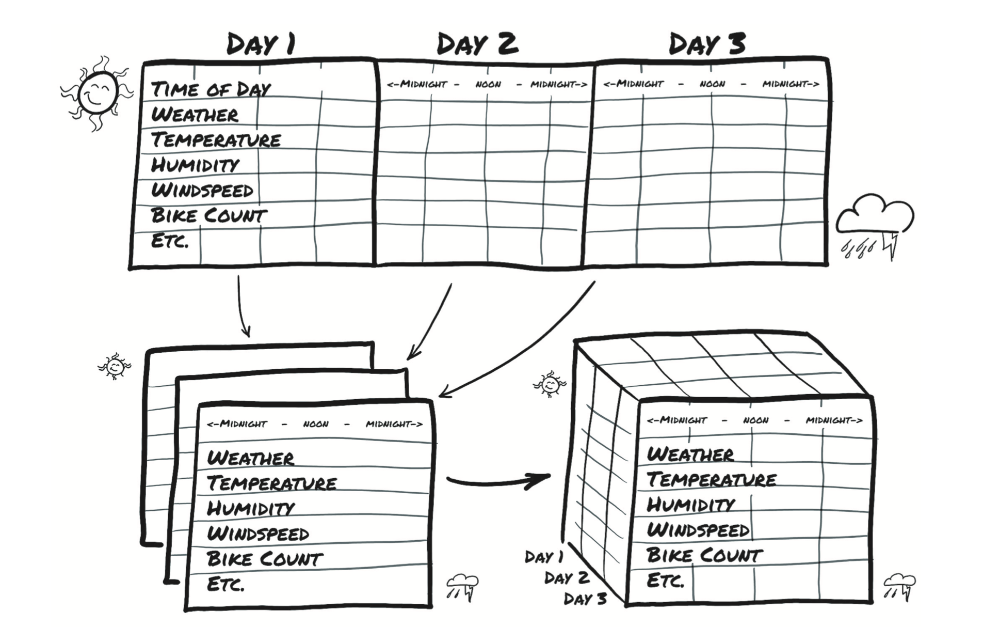
在源数据中，每一行是单独一个小时的数据（图3.2显示该数据的转置版本以更好地适合打印页面。）我们想改变行-小时的组织方式，这样你就可以使一个轴以天的速度增加，而另一个轴代表一天中的小时（与日期无关）。第三个轴每一列数据不同（天气，温度等）。

加载数据，如以下代码：

In [52]:
import numpy as np
import torch
bikes_numpy = np.loadtxt("./data/chapter3/hour-fixed.csv",
                         dtype=np.float32,
                         delimiter=",",
                         skiprows=1,
                         converters={1: lambda x: float(x[8:10])})
bikes = torch.from_numpy(bikes_numpy) 
bikes

tensor([[1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 3.0000e+00, 1.3000e+01,
         1.6000e+01],
        [2.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 8.0000e+00, 3.2000e+01,
         4.0000e+01],
        [3.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 5.0000e+00, 2.7000e+01,
         3.2000e+01],
        ...,
        [1.7377e+04, 3.1000e+01, 1.0000e+00,  ..., 7.0000e+00, 8.3000e+01,
         9.0000e+01],
        [1.7378e+04, 3.1000e+01, 1.0000e+00,  ..., 1.3000e+01, 4.8000e+01,
         6.1000e+01],
        [1.7379e+04, 3.1000e+01, 1.0000e+00,  ..., 1.2000e+01, 3.7000e+01,
         4.9000e+01]])

In [53]:
bikes.shape, bikes.stride()

(torch.Size([17520, 17]), (17, 1))

In [54]:
daily_bikes = bikes.view(-1, 24, bikes.shape[1])
# 这里-1的意思是自动，然后24是指24小时，bikes.shape[1]是原来bikes张量中的列数
# 这样就成功地把二维张量转化为三维的张量
daily_bikes, daily_bikes.shape, daily_bikes.stride()

(tensor([[[1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 3.0000e+00,
           1.3000e+01, 1.6000e+01],
          [2.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 8.0000e+00,
           3.2000e+01, 4.0000e+01],
          [3.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 5.0000e+00,
           2.7000e+01, 3.2000e+01],
          ...,
          [2.2000e+01, 1.0000e+00, 1.0000e+00,  ..., 3.0000e+00,
           3.1000e+01, 3.4000e+01],
          [2.3000e+01, 1.0000e+00, 1.0000e+00,  ..., 1.1000e+01,
           1.7000e+01, 2.8000e+01],
          [2.4000e+01, 1.0000e+00, 1.0000e+00,  ..., 1.5000e+01,
           2.4000e+01, 3.9000e+01]],
 
         [[2.5000e+01, 2.0000e+00, 1.0000e+00,  ..., 4.0000e+00,
           1.3000e+01, 1.7000e+01],
          [2.6000e+01, 2.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
           1.6000e+01, 1.7000e+01],
          [2.7000e+01, 2.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
           8.0000e+00, 9.0000e+00],
          ...,
          [4.5000e+01, 2.0000e+00, 1.0000e+00,  ..., 1.100

这里发生了什么？首先，`bikes.shape [1]`为`17`，它是自行车（`bikes`）张量中的列数。 但是代码的真正难点在于调用视图（view），这一点很重要：它改变了查看相同数据张量的方式。

在张量上调用视图方法（`view`）返回一个新的张量，该张量可以更改维数和步幅信息，而无需更改存储。结果，你可以以零成本重新布置张量因为根本没有数据被复制。你的视图（`view`）调用要求你为返回的张量提供新的形状。将-1用作占位符是为了“但是考虑到其他维度和元素的原始数量，还剩下很多索引”。

记住在这种情况下，存储（`Storage`）是连续的数字的线性容器——浮点数。你的自行车（`bikes`）张量在相应的存储中逐行存储，这一点已通过早期对bikes.stride()的调用输出确认。

对于`daily_bikes`，步幅告诉你沿小时维度（第二个）前进1个位置需要你将存储（或一组列）中的位置前进17个位置，而沿日期维度（第一个）前进则需要你在时间24小时中前进等于行长度的元素数（此处为`408`，即`17 * 24`）。

最右边的维度是原始数据集中的列数。在中间维度中，你将时间分为`24`个连续小时的块。换句话说，你现在每天有`C`个通道的`N`个`L`小时的序列。为了获得你所需的`NxCxL`顺序，你需要转置张量：

In [55]:
daily_bikes = daily_bikes.transpose(1, 2) 
# 这里是将第二个维度（1）和第三个维度（2）转置
daily_bikes.shape, daily_bikes.stride()

(torch.Size([730, 17, 24]), (408, 1, 17))

前面我们提到天气状况变量是有序数。实际上，它有4个等级：1表示最佳天气，而4表示最坏的天气。你可以将此变量视为分类变量，其级别解释为标签或者连续标签。如果你选择分类，则将变量转换为独热编码（one-hot）的向量，并将列与数据集连接起来。为了使你的数据渲染更容易，现在暂时限制为第一天。首先，初始化一个零填充矩阵，其行数等于一天中的小时数，列数等于天气等级的数:

In [56]:
first_day = bikes[:24].long()  # bikes 的前24列代表第一天的14小时
weather_onehot = torch.zeros(first_day.shape[0], 4) 
first_day[:,9], weather_onehot, first_day.shape

(tensor([1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2]),
 tensor([[0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.],
         [0., 0., 0., 0.]]),
 torch.Size([24, 17]))

In [57]:
first_day[:, 9], first_day[:, 9].unsqueeze(1), first_day[:, 9].unsqueeze(1) - 1
# first_day[:, 9]: 获取第一天的24小时的天气情况
# first_day[:, 9]: 将获取的第一天的天气情况的一维数组变成

(tensor([1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 2, 2, 2, 2]),
 tensor([[1],
         [1],
         [1],
         [1],
         [1],
         [2],
         [1],
         [1],
         [1],
         [1],
         [1],
         [1],
         [1],
         [2],
         [2],
         [2],
         [2],
         [2],
         [3],
         [3],
         [2],
         [2],
         [2],
         [2]]),
 tensor([[0],
         [0],
         [0],
         [0],
         [0],
         [1],
         [0],
         [0],
         [0],
         [0],
         [0],
         [0],
         [0],
         [1],
         [1],
         [1],
         [1],
         [1],
         [2],
         [2],
         [1],
         [1],
         [1],
         [1]]))

In [58]:
weather_onehot.scatter_(dim=1, index=first_day[:,9].unsqueeze(1) - 1, value = 1.0)

tensor([[1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [1., 0., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 0., 1., 0.],
        [0., 0., 1., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.],
        [0., 1., 0., 0.]])

这一天从1级天气开始到2级天气结束，所以这似乎是正确的。

最后，使用cat函数将矩阵连接到原始数据集。看你的第一个结果：

In [59]:
torch.cat((bikes[:24], weather_onehot), 1)

tensor([[1.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         0.0000e+00, 6.0000e+00, 0.0000e+00, 1.0000e+00, 2.4000e-01, 2.8790e-01,
         8.1000e-01, 0.0000e+00, 3.0000e+00, 1.3000e+01, 1.6000e+01, 1.0000e+00,
         0.0000e+00, 0.0000e+00, 0.0000e+00],
        [2.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00,
         0.0000e+00, 6.0000e+00, 0.0000e+00, 1.0000e+00, 2.2000e-01, 2.7270e-01,
         8.0000e-01, 0.0000e+00, 8.0000e+00, 3.2000e+01, 4.0000e+01, 1.0000e+00,
         0.0000e+00, 0.0000e+00, 0.0000e+00],
        [3.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 2.0000e+00,
         0.0000e+00, 6.0000e+00, 0.0000e+00, 1.0000e+00, 2.2000e-01, 2.7270e-01,
         8.0000e-01, 0.0000e+00, 5.0000e+00, 2.7000e+01, 3.2000e+01, 1.0000e+00,
         0.0000e+00, 0.0000e+00, 0.0000e+00],
        [4.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00, 3.0000e+00,
         0.0000e+00, 6.0000e+00, 0.0000e+00, 1.0000e

在这里，你指定了原始自行车（bikes）数据集和独热编码的天气情况矩阵，这些矩阵将沿列维（例如1）连接在一起。换句话说，将两个数据集的列堆叠在一起，或者将新的独热编码列追加到原始数据集。为了使cat成功，张量必须与其他维度（行维度在这种情况也想通）有相同的大小。

请注意，你最后的新四列分别是1,0,0,0——这正是你所期望的天气等级1。

你也可以使用重新排列的daily_bikes张量完成相同的操作。请记住，它的形状为（B,C,L），其中L=24。首先创建零张量，有相同的B和L，但增加的列数与C：

In [60]:
daily_weather_onehot = torch.zeros(daily_bikes.shape[0], 4,
daily_bikes.shape[2]) 
daily_weather_onehot.shape # 创建一个全部是0，形状如下的张量

torch.Size([730, 4, 24])

然后将独热编码散布到C维中的张量中。由于操作是在原地执行的，因此仅张量的内容会更改：

In [61]:
daily_weather_onehot.scatter_(1, daily_bikes[:,9,:].long().unsqueeze(1) - 1,
                                                            1.0) 
daily_weather_onehot.shape, daily_weather_onehot

(torch.Size([730, 4, 24]),
 tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 1., 1., 1.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[1., 1., 1.,  ..., 1., 1., 1.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         ...,
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[1., 1., 1.,  ..., 1., 1., 1.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0.,

沿C维度连接：

In [62]:
daily_bikes = torch.cat((daily_bikes, daily_weather_onehot), dim=1)
daily_bikes

tensor([[[1.0000e+00, 2.0000e+00, 3.0000e+00,  ..., 2.2000e+01,
          2.3000e+01, 2.4000e+01],
         [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
          1.0000e+00, 1.0000e+00],
         [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
          1.0000e+00, 1.0000e+00],
         ...,
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.0000e+00,
          1.0000e+00, 1.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00]],

        [[2.5000e+01, 2.6000e+01, 2.7000e+01,  ..., 4.5000e+01,
          4.6000e+01, 4.7000e+01],
         [2.0000e+00, 2.0000e+00, 2.0000e+00,  ..., 2.0000e+00,
          2.0000e+00, 2.0000e+00],
         [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 1.0000e+00,
          1.0000e+00, 1.0000e+00],
         ...,
         [1.0000e+00, 1.0000e+00, 1.0000e+00,  ..., 0.0000e+00,
          0.000

## 3.3 文本数据

深度学习席卷了自然语言处理（natural language processing, NLP）领域，尤其是通过使用不断消耗输入和模型先前输出相结合的模型。这种模型称为递归神经网络（recurrent neural networks, RNN），它已被成功应用于文本分类、文本生成和自动翻译系统。在这之前的NLP工作的特点是复杂的多阶段处理流程，包括编码语言语法的规则。

> - Nadkarni et al., “Natural language processing: an introduction”. JAMIA
   https://www.ncbi.nlm.nih.gov/pmc/arti-cles/PMC3168328
> - Wikipedia entry for natural language processing:
   https://en.wikipedia.org/wiki/Natural-language_processing
   
目前，最先进的（state-of-the-art）工作在大型语料库上端到端地从头开始训练网络，让这些规则从数据中浮现出来。在过去的几年中，互联网上最常用的自动翻译系统服务就是基于深度学习的。

在本章中，你的目标是将文本转换成神经网络可以处理的东西，就像前面的例子一样，即数值张量。在处理成数值张量之后，再为你的文本处理工作选择正确的网络结构，然后就可以使用PyTorch进行NLP了。你马上就会看到此功能的强大之处：如果你以正确的形式提出了问题，就可以使用相同的PyTorch工具在不同领域中的任务上达到目前最先进的性能。这项工作的第一部分是重塑数据。

网络在两个级别上对文本进行操作：在字符级别上，一次处理一个字符；而在单词级别上，单词是网络中最细粒度的实体。无论是在字符级别还是在单词级别操作，将文本信息编码为张量形式的技术都是相同的。这种技术没什么神奇的，你之前已经用过了，即独热编码。

我们从字符级示例开始。首先，获取一些文本进行处理。Gutenberg项目是一个很棒的资源，它是一项志愿性的工作，它对文化作品进行数字化并存档，并使其以开放格式（包括纯文本文件）免费提供。如果你的目标是大型语料库，那么维基百科语料库就非常出色：它是维基百科文章的完整集合，其中包含19亿个单词和超过440万条文章。你可以在英语语料库网站上找到其他几种语料库。

从Gutenberg项目网站上加载Jane Austen的《傲慢与偏见》（点击下载）。保存文件并读入文件，如下所示。

In [63]:
with open('./data/chapter3/1342-0.txt', encoding='utf8') as f:
    text = f.read()

在继续之前，你需要先注意一个细节：编码（encoding）。编码是一个宽泛的词，因此我们现在要做的就是实际“触摸”它。每个字符都由一个代码表示，该代码是一系列适当长度的比特（bit）位，它可以唯一地标识每个字符。最简单的这种编码是ASCII（American Standard Code for Information Interchange），其历史可以追溯到1960年代。ASCII使用128个整数对128个字符进行编码。例如，字母“a”对应于二进制1100001或十进制97；字母“b”对应于二进制1100010或十进制98，依此类推。该编码刚好8位，这在1965年是一个很大的收获。

> 注意：显然，128个字符不足以正确表示除英语之外的其他书面文字所需的所有字形、字音、连字等等。为此，其他编码被开发了出来，用更多的比特位代码表示更大范围的字符。更大范围的字符被标准化为Unicode编码，它将所有已知字符映射为数字，这些数字的位表示由特定编码提供。流行的编码包括UTF-8、UTF-16和UTF-32，对应数字分别是8位、16位或32位整数的序列。 Python 3.x中的字符串是Unicode字符串。

你将对字符进行独热编码，以将独热编码限制为对要分析的文本有用的字符集。在本例中，因为你以英文加载了文本，所以使用ASCII这种小型编码是非常安全的。你也可以将所有字符都转换为小写，以减少编码中的字符数。同样，你还可以筛选出与预期的文本类型无关的标点符号、数字和其他字符，这可能会也可能不会对你的神经网络产生实际的影响，具体取决于手头的任务。

此时，你需要解析文本中的字符，并为每个字符进行独热编码。 每个字符将由一个长度等于编码中字符数的向量表示。该向量除了有一个元素是1外其他全为0，这个1的索引对应该字符在字符集中的位置。

首先，将文本分成若干行，然后选择任意一行：

In [64]:
lines = text.split('\n')
line = lines[40]
line, lines[41]

('It is a truth universally acknowledged, that a single man in possession',
 'of a good fortune, must be in want of a wife.')

In [65]:
line = lines[200]
line

'“Impossible, Mr. Bennet, impossible, when I am not acquainted with him'

In [66]:
letter_tensor = torch.zeros(len(line), 128) # 128是由于ASCII的限制
letter_tensor.shape

torch.Size([70, 128])

请注意，`letter_tensor`每行将要表示一个独热编码字符。现在在每一行正确位置上设置成1，以使每一行代表正确的字符。设置1的索引对应于编码中字符的索引：

In [67]:
print(line.lower().strip())
for i, letter in enumerate(line.lower().strip()):
    # 文本里含有双引号，不是有效的ASCII，因此在此处将其屏蔽
    letter_index = ord(letter) if ord(letter) < 128 else 0
    letter_tensor[i][letter_index] = 1

“impossible, mr. bennet, impossible, when i am not acquainted with him


你已经将句子独热编码成神经网络可以使用的表示形式。你也可以沿张量的行，通过建立词汇表来在词级别（word-level）对句子（即词序列）进行独热编码。由于词汇表包含许多单词，因此该方法会产生可能不是很实际的很宽的编码向量。在本章的后面，你将看到一种更有效的方式，通过使用嵌入（embedding）来在单词级别表示文本。现在，坚持独热编码，看看会发生什么。

定义clean_words函数，它接受文本并将其返回小写并删除标点符号。在“Impossible, Mr. Bennet”行上调用它时，会得到以下信息：

In [68]:
def clean_words(input_str):
    punctuation = '.,;:"!?”“_-'
    word_list = input_str.lower().replace('\n',' ').split()
    word_list = [word.strip(punctuation) for word in word_list]
    return word_list
words_in_line = clean_words(line)
line, words_in_line

('“Impossible, Mr. Bennet, impossible, when I am not acquainted with him',
 ['impossible',
  'mr',
  'bennet',
  'impossible',
  'when',
  'i',
  'am',
  'not',
  'acquainted',
  'with',
  'him'])

接下来，在编码中建立单词到索引的映射：

In [69]:
word_list = sorted(set(clean_words(text)))
word2index_dict = {word: i for (i, word) in enumerate(word_list)}
len(word2index_dict), word2index_dict['impossible']

(7261, 3394)

请注意，word2index_dict现在是一个字典，其中单词作为键，而整数作为值。独热编码时，你将使用此词典来有效地找到单词的索引。

现在专注于句子，将其分解为单词并对其进行独热编码（即对每个单词使用一个独热编码向量来填充张量）。先创建一个空向量，然后赋值成句子中的单词的独热编码：

In [70]:
word_tensor = torch.zeros(len(words_in_line), len(word2index_dict))
for i, word in enumerate(words_in_line):
    word_index = word2index_dict[word]
    word_tensor[i][word_index] = 1
    print('{:2} {:4} {}'.format(i, word_index, word))

print(word_tensor.shape)

 0 3394 impossible
 1 4305 mr
 2  813 bennet
 3 3394 impossible
 4 7078 when
 5 3315 i
 6  415 am
 7 4436 not
 8  239 acquainted
 9 7148 with
10 3215 him
torch.Size([11, 7261])


此时，`word_tensor`表示长度为11编码长度为7261（这是字典中单词的数量）的一个句子。

## 3.3.1 文本嵌入

独热编码是一种将类别数据表示成张量的很有用技术。就像你可能预料到的那样，当需要编码的项目数很大（例如语料库中的单词）时，独热编码就开始崩溃了。一本书中有超过7000个单词！

当然，你可以做一些工作来对单词进行去重、压缩替代拼写、将过去和将来时统一为相同表示，等等。尽管如此，通用的英文编码仍将是巨大的。更糟糕的是，每次遇到一个新单词时，都必须在向量中添加一个新列，这意味着要在模型中添加一组新的权重以解决该新词汇输入问题，从训练角度看这将给你带来很大的痛苦。

如何将编码压缩为更易于管理的大小，并限制大小增长？好吧，可以使用浮点数向量，而不是使用多个0和一个1的向量。举例来说，一个含100个浮点数的向量就可以表示很大量的词汇。关键是找到一种有效的方法，以一种有助于下游学习的方式将单个单词映射到这个100维空间。这种技术称为嵌入（embedding）。

原则上，你可以遍历词汇表并为每个单词生成100个随机浮点数。 这种方法可能是有效的，因为你可以将大量词汇塞入100个数字中，但是它会丢弃掉基于语义或上下文的单词之间的任何距离信息。使用这种词嵌入的模型不得不处理其输入向量中的少量结构。理想的解决方案是以这样的方式生成嵌入：用于同一上下文的单词映射到嵌入空间的邻近区域。

如果要手工设计解决此问题的方法，你有可能决定通过沿轴映射基本名词和形容词来构建嵌入空间。你可以生成一个二维空间，在该空间中，两个坐标轴分别映射到名词“水果”（0.0-0.33）、“花”（0.33-0.66）和“狗”（0.66-1.0），以及形容词“红色”（0.0-0.2）、“橙色”（0.2-0.4）、“黄色”（0.4-0.6）、“白色”（0.6-0.8）和“棕色”（0.8-1.0）。你现在的目标是将水果、花和狗放置在嵌入中。

开始嵌入单词时，可以将“苹果”映射到“水果”和“红色”象限中的某个数。同样，你可以轻松地映射“橘子”、“柠檬”、“荔枝”和“猕猴桃”（五颜六色的水果）。然后，你可以从花开始，分配“玫瑰”、“罂粟”、“水仙花”、“百合”和...好吧，不存在很多棕色的花。好，“太阳花”可以推出“花”、“黄色”和“棕色”，而“雏菊”可以推出“花”、“白色”和“黄色”。也许你应该更新“猕猴桃”以将其映射到“水果”、“棕色”和“绿色”附近。对于狗和颜色，“redbone（译者注：狗的品种）”、“fox”可能是“橙色”、“金毛”和“贵宾犬”可是“白色”的，以及...大多数种类的狗都是“棕色”的。

尽管对于大型语料库而言，手动进行此映射并不可行，但你应注意，尽管嵌入大小仅为2，但你描述了除基数8个之外的15个不同的单词，如果你花一些创造性的时间，可能还会嵌入更多的单词。

你可能已经猜到了，这种工作是可以自动进行的。通过处理大量文本语料库，你可以生成与此类似的嵌入。主要区别在于嵌入向量具有100到1000个元素，并且坐标轴不直接映射到某个词义，但是意思相近的词映射到嵌入空间也是相近的，其轴可能是任意的浮点维（floating-point dimensions）。

尽管实际使用的算法（比如word2vec）对于我们在此要关注的内容来说有点超出范围，但值得一提的是，嵌入通常是使用神经网络并试图根据句中邻近词（上下文）预测某个词而生成的。在这种情况下，你可以从独热编码的单词开始，使用（通常是相当浅的）神经网络来生成嵌入。当嵌入可用时，你就可以将其用于下游任务。

生成的嵌入的一个有趣的方面是，相似的词不仅会聚在一起，还会与其他词保持一致的空间关系。如果你要使用“苹果”的嵌入向量，并加上和减去其他词的嵌入向量，就可以进行类比，例如苹果 - 红色 - 甜 + 酸，最后可能得到一个类似“柠檬”的向量。

我们不会在这里使用文本嵌入，但是当必须用数字向量表示集合中的大量元素时，它们是必不可少的工具。

## 3.4 图像数据

卷积神经网络的出现彻底改变了计算机视觉，基于图像的系统从此获得了一系列新的能力。通过使用成对的输入和期望的输出样本来训练端到端网络，可以前所未有地解决需要高度优化算法块构建的复杂模型。为了参与到这场革命中，你需要能够从常见的图像格式中载入图像，然后将数据转换为张量表示，该张量以PyTorch所期望的方式排列图像的各个部分。

图像表示为按规则网格排列的标量集合，并且具有高度和宽度（以像素为单位）。每个网格点（像素）可能只有一个标量，这种图像表示为灰度图像；或者每个网格点可能有多个标量，它们通常代表不同的颜色或不同的特征（features），例如从深度相机获得的深度。

代表单个像素值的标量通常使用8位整数编码，例如在消费类相机中。在医学、科学和工业应用中，你经常会发现具有较高数字精度的像素，例如12位和16位。如果像素对有关物理特性的信息例如骨密度、温度或深度进行编码，则此高精度可提供更大的（表示）范围或更高的灵敏度。

你有几种用数字编码颜色的方法。最常见的是RGB，它定义用三个数字表示颜色，这三个数字分别代表红色、绿色和蓝色的强度。你可以将一个颜色通道视为仅讨论该颜色时的灰度强度图，例如你通过一副纯红色太阳镜观察场景时所看到的情况。图3.3显示了一条彩虹，其中的每个RGB通道都捕获了光谱的特定部分。（该图被简化了，省略了一些东西。例如，橙色和黄色带表示为红色和绿色的组合。）

图像有好几种文件格式，但是幸运的是，你有很多方法可以在Python中加载图像。首先使用imageio模块加载PNG图像。在本章中，你将使用imageio方法，因为它通过统一的API处理不同的数据类型。现在加载图像，如以下所示。

In [71]:
import imageio
img_arr = imageio.imread('./data/chapter3/bobby.jpg') 
img_arr.shape

(720, 1280, 3)

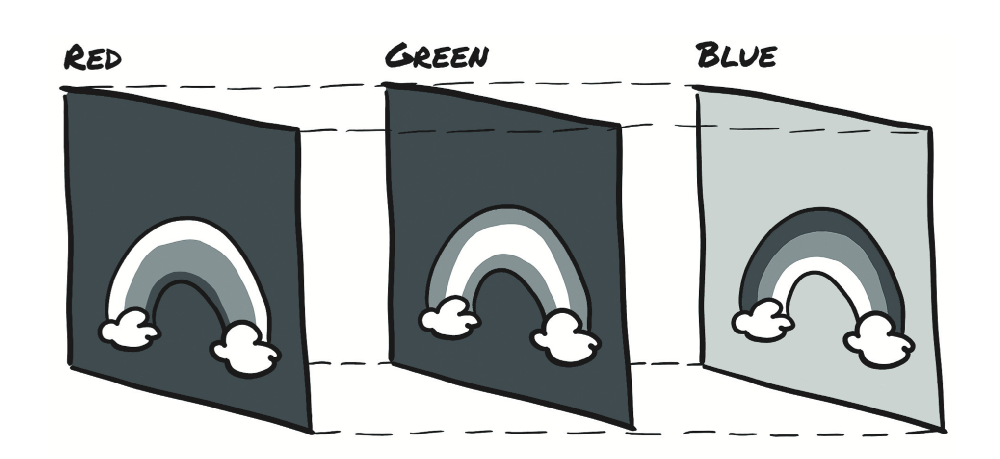
此例中，`img_arr`是一个NumPy数组对象，它有三个维度：两个空间维度（宽度和高度），以及对应于红色、绿色和蓝色的第三个维度。任何输出NumPy数组的库都这样做以获得PyTorch张量。唯一需要注意的是维度的设置，PyTorch模块处理图像数据需要将张量设置为`C x H x W`（分别为通道、高度和宽度）。

你可以使用转置（`transpose`）函数获得正确的维度设置。给定`W x H x C`的输入张量，你可以通过交换第一个和最后一个通道来获得正确的维度设置：

In [72]:
img = torch.from_numpy(img_arr) 
out = torch.transpose(img, 0, 2)

你之前已经看过此示例，但是请注意此操作不会复制张量数据。相反，out使用与img相同的内部存储，只是修改了张量的尺寸和步幅信息。这种安排很方便，因为操作的代价很少，但是（当心）更改img中的像素值会导致out变化。

还要注意其他深度学习框架使用不同的维度设置。最初，TensorFlow将通道尺寸保持在最后，从而形成`H x W x C`布局。（现在，它已经支持多种布局。）从底层性能角度来看此策略具有优缺点，但只要适当地重塑（reshape）你的张量它就不会对你有所影响。

到目前为止，你已经描述了一张图片。遵循与以前的数据类型相同的策略，创建包含多个图像的数据集以用作神经网络的输入，然后沿着第一维将这些图像按照批量存储，以获得`N x C x H x W`张量。

一个高效的选择就是使用堆叠（`stack`）来构建这个张量，你可以预先分配适当尺寸的张量，并用从文件夹中加载图像填充它，

In [73]:
batch_size = 100
batch = torch.zeros(100, 3, 256, 256, dtype=torch.uint8)

这表示你的批次将包含100个RGB图像，分别为256像素高度和256像素宽度。注意张量的类型：你期望每种颜色都以8位整数表示，就像大多数标准消费相机照出的相片格式一样。现在你可以从输入的文件夹中加载所有的png图像并将其存储在张量中：

In [74]:
import os
data_dir = './data/chapter3/image-cats/'
filenames = [name for name in os.listdir(data_dir) if os.path.splitext(name) == '.png']
for i, filename in enumerate(filenames):
  img_arr = imageio.imread(filename)
  batch[i] = torch.transpose(torch.from_numpy(img_arr), 0, 2)

如前所述，神经网络通常使用浮点张量作为输入。正如你将在接下来的章节中看到的那样，当输入数据的范围大约为0到1或–1到1时，神经网络表现出最佳的训练性能（影响来自于其如何构造模块的定义。）

你一贯要做的事情是将张量转换为浮点数并归一化像素值。强制转换为浮点数很容易，但是归一化比较麻烦，因为它取决于你决定的输入的哪个范围应该落在0到1（或–1到1）之间。一种可能的选择是将像素的值除以255（8位无符号最大可表示的数字）：

In [75]:
batch = batch.float()
batch /= 255.0

## 3.5 体积数据

你已经学习了如何加载和表示2D图像，比如使用相机拍摄的图像。在诸如涉及CT（Computed Tomography）扫描等医学成像应用程序的情况下，通常需要处理从头到脚方向堆叠的图像序列，每个序列对应于整个身体的横截面。在CT扫描中，强度代表身体不同部位的密度：肺、脂肪、水、肌肉、骨骼，以密度递增的顺序排列，当在临床工作站上显示CT扫描时，会从暗到亮映射。根据穿过人体后到达检测器的X射线量计算每个点的密度，并使用一些复杂的数学运算将原始传感器数据反卷积（deconvolve）为完整体积数据。

CT具有单个的强度通道，这类似于灰度图像。通常在本地数据格式中，通道维度被忽略了，因此原始数据通常会具有三个维度。通过将单个2D切片堆叠到3D张量中，你可以构建表示对象的3D解剖结构的体积数据。与图3.3不同，图3.4中的额外的维表示物理空间中的偏移量，而不是可见光谱的特定频带。

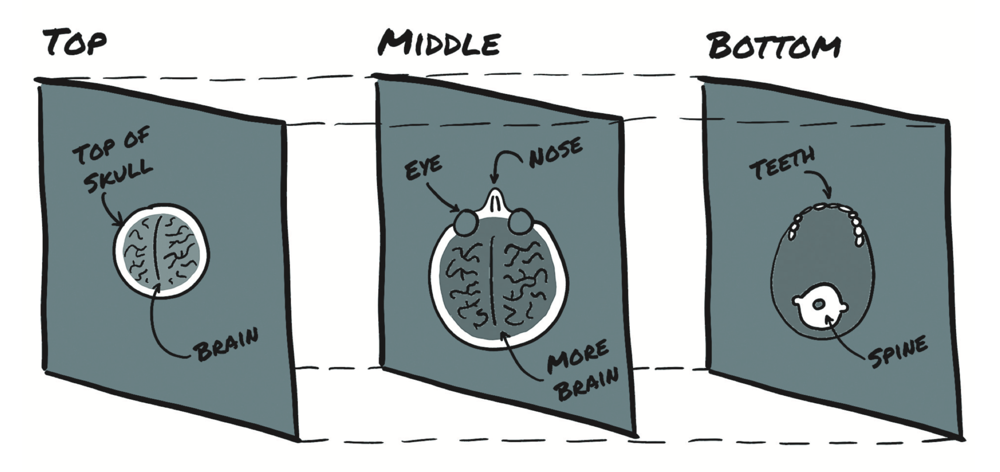
图3.4 从头顶到颌骨的CT扫描切片

我们并不会在此处详细介绍医学成像数据格式。现在，足以说存储体积数据的张量和存储图像数据的张量之间不存在根本差异。在通道（channel）维之后，你有一个额外的维——深度（depth），形成5D张量为N x C x D x H x W。

使用imageio模块中的volread函数加载一个CT扫描样本，该函数以文件夹作为参数，将所有DICOM（Digital Imaging Communication and Storage，数字图像通信和存储）系列文件组合成一个NumPy 3D数组中，如下所示。

In [76]:
import imageio
dir_path = "./data/chapter3/volumetric-dicom/2-LUNG 3.0  B70f-04083" 
vol_arr = imageio.volread(dir_path, 'DICOM') 
vol_arr.shape

Reading DICOM (examining files): 1/99 files (1.0%99/99 files (100.0%)
  Found 1 correct series.
Reading DICOM (loading data): 88/99  (88.999/99  (100.0%)


(99, 512, 512)

同样，由于缺少通道信息，此时的维度设置与PyTorch所期望的不同。你必须通过unsqueeze为新增通道（channel）维：

In [77]:
vol = torch.from_numpy(vol_arr).float() 
vol = torch.transpose(vol, 0, 2) 
vol = torch.unsqueeze(vol, 0)
vol.shape

torch.Size([1, 512, 512, 99])

## 4.0 学习机制

随着近十年来机器学习的蓬勃发展，从经验中学习的机器这一概念已成为技术和媒体界的主流。那么，机器到底是如何学习的？学习的机制或背后的算法是什么？从外部观察者的角度来看，学习算法就是将输入数据与所需输出配对。当学习完成后，该算法在输入与训练后的输入数据足够相似的新数据时，便能够产生正确的输出。借助深度学习，即使输入数据和所需的输出来自彼此不同的域（例如图像和描述它的句子）时，该过程也可以正常工作。

实际上，解释输入/输出关系的模型可以追溯到几个世纪之前。翰尼斯·开普勒（Johannes Kepler，1571-1630，德国数学天文学家）基于他的导师Tycho Brahe用肉眼（是的，一双眼和一张纸）观察的数据，在1600年代初弄清楚了他的三个行星运动定律。当时开普勒没有牛顿的万有引力定律可供使用（实际上，牛顿反倒利用开普勒的著作来解决问题），他只是推断出最简单的几何模型来拟合数据。值得一提的是，根据Michael Fowler的描述，他花了6年的时间盯着那些对他没有意义的数据来逐渐实现并制定这些定律。你可以在图4.1中看到这个过程。

第一条定律是：“每个行星的轨道都是椭圆形，太阳位于两个焦点之一。” 他不知道是什么原因使轨道成为椭圆形，但给定行星（或大行星的卫星，例如木星）的一组观测值，他可以估算出椭圆的形状（eccentricity，偏心率）和大小（semi-latus rectum，正半焦距）。利用从数据中计算出的这两个参数，他可以判断出行星在天空中可能位于何处。当他计算出第二定律（“一条连接行星和太阳的线在相等的时间间隔内扫出相等的区域”）时，他还可以根据给出的观测结果判断出行星何时到达空间中的特定点。

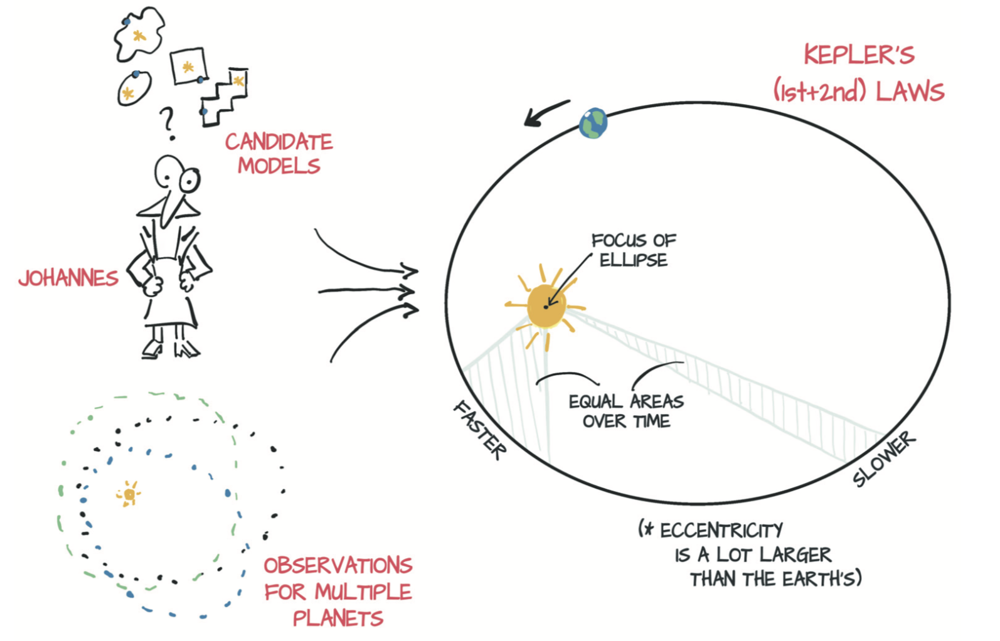

开普勒如何在没有计算机、微型计算器甚至微积分（那时这些都还没被发明出来的）的情况下估算椭圆的偏心率和尺寸？ 你可以从开普勒自己在《新天文学》（New Astronomy）一书中的回忆，或者从J.V. Field的《证明的起源》（The Origins of Proof）系列中找到答案：

本质上，开普勒必须使用一定数量的观测值来计算出曲线以尝试不同形状，然后使用计算出的曲线估计出更多位置，这是他拥有观测值的时间。然后检查这些计算出的位置是否与观测到的位置一致。

总结一下，开普勒在过去的六年里

从他的朋友Brahe那里得到了很多好的数据（费了一些周折）。
试图将这些数据可视化，因为他觉得有的（数据）有些可疑。
选择有可能拟合数据的最简单的模型（椭圆）。
划分数据，以便处理部分数据并保留独立的数据集用来验证。
从试探性的偏心率和大小开始，然后进行迭代直到模型拟合观察结果为止。
根据独立的数据集验证他的模型。
难以置信地回顾。
这就是一本从1609走来的数据科学手册。

正如科学家们在几个世纪以来所学到的那样，科学的历史是建立在这七个步骤之上的，背离它们就是灾难的根源。（除非你是一个理论物理学家:D）

这些步骤正是你想从数据中学到东西所需的。在这里，说拟合（fit）数据和说让算法从数据中学习几乎没有区别。该过程始终涉及具有未知参数的函数，其参数是根据数据估算的，简称模型（model）。

你可以说“从数据中学习”假设了模型不是旨在解决特定问题（如开普勒工作中的椭圆问题）而是能够估计更广泛的函数簇。神经网络可以预测Tycho Brahe的轨迹而无需开普勒的独到见解来尝试将数据拟合到椭圆上。然而，牛顿从通用模型中得出万有引力定律将要困难得多。

你可能对后一种模型感兴趣：这些模型不是为解决特定任务而设计的，而是可以用输入输出对自动适应于解决许多类似任务，换句话说，就是经过在与手头任务相关的数据上训练的通用模型。具体来讲，PyTorch就是旨在简化创建模型的过程，对于该模型，拟合误差相对于参数的导数可以被解析地表达出来。如果你不理解最后一句话，请不要担心，4.1.1节会为你清除疑惑。

本章介绍如何自动进行通用函数拟合过程，这是使用深度学习所做的全部工作，而深度神经网络就是通用函数，PyTorch使此过程尽可能简单和透明。为了确保正确理解关键概念并让你从原理中了解学习算法的机制，我们将从比深度神经网络简单得多的模型开始。

## 4.1 学习就是参数估计


在本节，你将学习如何获取数据，选择模型并估计模型的参数，以便对新数据给出良好的预测。为此，您将摆脱行星运动的复杂性，将注意力转移到物理学上第二困难的问题上：仪器校准。

图4.2简要概述了本章结束时你将要实现的内容。给定输入数据和相应的期望输出（ground truth）以及权重的初始值，模型输入数据（前向传播），然后通过把结果输出与ground truth进行比较来评估误差。为了优化模型的参数，其权重（即单位权重变化引起的误差变化，也即误差相对于参数的梯度）通过使用对复合函数求导的链式法则进行计算（反向传播）。然后，权重的值沿导致误差减小的方向更新。不断重复该过程直到在新数据上的评估误差降至可接受的水平以下。

上述内容你听起来可能有点晦涩难懂，我们将用整整一章进行阐释。待我们完成时，所有内容都将就位，到时你就能理解上一段的意义。

接下来，你要处理含噪声的数据集，建立模型并为其实现一个学习算法。你首先手动完成所有操作，但是到本章结束时，你就可以让PyTorch完成所有繁重的工作。到本章结束时，我们将涵盖训练深度神经网络的许多基本概念，即使示例很简单且其模型（还）不是神经网络。

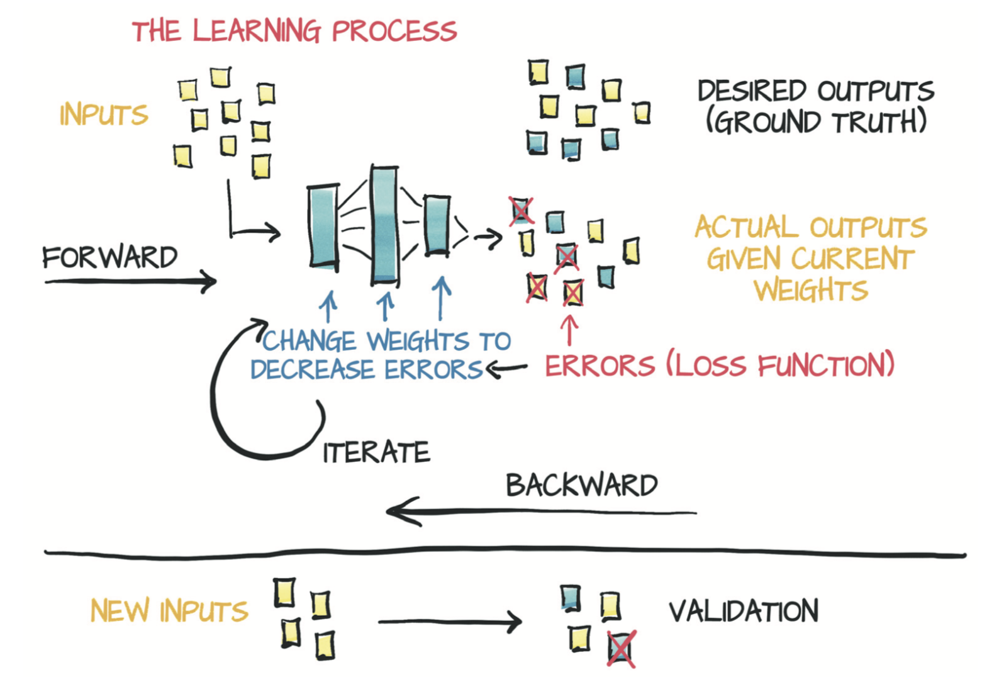

### 4.1.1 一个热门的问题
假设你去了一些鲜为人知的地方旅游，然后带回了一个花哨的壁挂式模拟温度计。这个温度计看起来很棒，非常适合你的客厅。唯一的缺点是它不显示单位。不用担心，你有一个计划。你用自己喜欢的单位建立一个读数和相应温度值的数据集，然后选择一个模型，并迭代调整单位的权重，直到误差的测量值足够低为止，最后你就可以在新温度计上进行准确读数了。

首先记录能正常工作的旧摄氏温度计的数据和你刚带回来的新温度计对应的测量值。几周后，你得到了一些数据:

In [78]:
t_c = [0.5,  14.0, 15.0, 28.0, 11.0,  8.0,  3.0, -4.0,  6.0, 13.0, 21.0]
t_u = [35.7, 55.9, 58.2, 81.9, 56.3, 48.9, 33.9, 21.8, 48.4, 60.4, 68.4]
t_c = torch.tensor(t_c)
t_u = torch.tensor(t_u)

t_c是摄氏度数，t_u是未知单位度数。你可以假设两种测量结果中的噪声均来自温度计本身以及读数误差。为了方便起见，我们将数据转换成张量，你将很快使用它。

### 4.1.2 选择线性模型作为首次尝试

在没有进一步知识的情况下，我们先假定一个用于在两组测量之间相互转换的最简单的可能模型，就像开普勒所做的那样。两组数据可能是线性相关的，也就是说，将t_u乘以一个因子并加上一个常数就得到了摄氏温度：

$$t_c = w * t_u + b$$

> 注意：我们知道线性模型是正确的，因为问题和数据都是我们捏造的，但请原谅我们；因为该模型是一个有用的激励示例（motivating example），有助于你了解PyTorch的内部工作机制。

现在，你需要根据已有的数据估算模型中的参数 w 和 b。 为了根据未知温度 $t_u$
  获得以摄氏度为单位的温度值 $t_c$
 ，你必须对这两个参数进行估计。该过程听起来像是通过一组测量值来拟合一条直线，那正是你正在做的事情。当你使用PyTorch实现此简单示例时，应意识到训练神经网络本质上就是通过调整一些（可能很大量的）参数将模型更改为更为精确的模型。

为了再次具体化示例，设想你有一个带有一些未知参数的模型，并且需要估计这些参数，以使预测输出与测量值之间的误差尽可能小。你注意到仍然需定义如何度量这种误差。如果误差很大，那么这种度量（我们称为损失函数）应该很高，而完美匹配时的理想情况下应该尽可能低。因此，你的优化过程应以找到使损失函数处于最低水平的 w 和 b 为目标。

### 4.1.3 你所需的是减少损失

损失函数（或成本函数）是输出为单个数值的函数，在学习过程中我们试图最小化它。损失函数通常是计算训练样本的期望输出与模型接收这些样本所产生的实际输出之间的差异，在本例中，即是模型输出的预测温度 $t_p$ 与实际测量值之间的差异 $ t_p-t_c$。

你需要确保在 $t_p$ 高于和低于真实 $t_c$ 时，损失函数都会输出正值，因为目标是使损失函数最小。（将损失优化至负无穷是没有用的。）你有几种选择，最直接的是 $|t_p-t_c|$ 和 $ (t_p-t_c)^2 $。基于你所选择的数学表达式，你可以强调或消除某些损失。从概念上讲，损失函数是一种从训练样本中优先确定的要修复哪些错误的方法，这样，参数更新将导致对高权重样本的输出进行调整，而不是对损失较小的其他样本输出进行更改。

刚刚的两个示例损失函数都具有明显的最小零值，并且随着预测值在任一方向上远离真实值而单调递增。由于这个原因，两个函数都被认为是凸的（convex）。因为你的模型是线性的，所以得到的关于 $w$ 和 $b$ 的损失函数也是凸的。损失函数是模型参数的凸函数的情况通常比较好处理，因为你可以通过专门的算法以有效的方式找到最小值。深度神经网络的损失函数不保证是凸的，因此这些方法通常对你没有用。

对于损失函数 $| t_p-t_c |$ 和 $(t_p-t_c)^2$，如图4.3所示，需要注意的是后者在最小值附近表现得更好：当 $t_p$ 等于 $t_c$ 时，误差平方损失相对于 $t_p$ 的导数为零。相反，绝对误差损失函数在你想要收敛的位置具有不确定的导数。实际上这个问题并没有看起来那么重要，但是暂时坚持使用误差平方损失。

值得注意的是，误差平方损失还比绝对误差损失更严重地惩罚了错误的结果。通常，稍微出错的结果是要好于一些严重错误的结果的，误差平方损失有助于按需要对这些结果进行优先级排序。

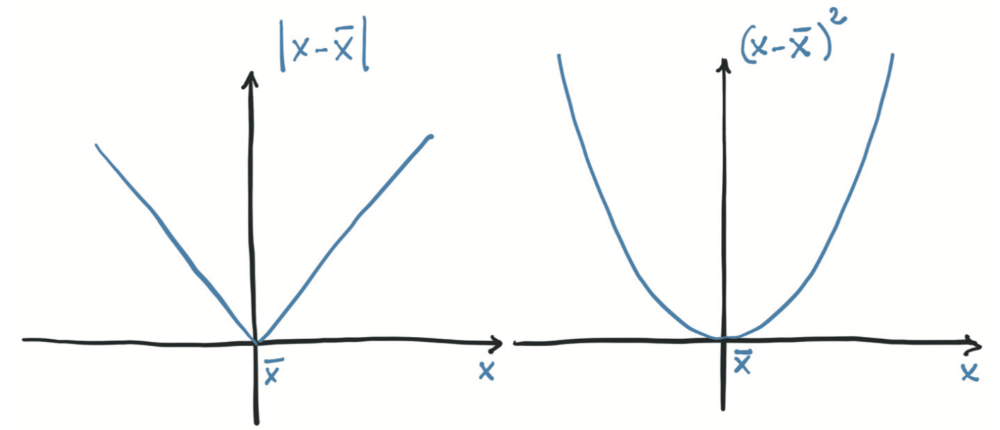
图4.3 绝对误差与平方误差

### 4.1.4 从问题到PyTorch

你已经弄清楚了模型和损失函数，所以你已经弄清楚了高层图的一部分。现在你需要启动学习过程并提供实际数据。另外，数学符号已经讲得够多了，现在切换到PyTorch。毕竟，你是来这里玩的。

你已经创建了数据张量，因此将模型写为Python函数

In [79]:
def model(t_u, w, b):
    return w * t_u + b

其中你期望`t_u`、`w`和`b`分别为输入张量、权重参数和偏置参数。在你的模型中，参数是PyTorch标量（也称为零维张量），并且乘积运算将使用广播（broadcast）来产生返回的张量。 现在定义损失：

In [80]:
def loss_fn(t_p, t_c):
    squared_diffs = (t_p - t_c)**2
    return squared_diffs.mean()

请注意，你正在建立一个张量差，然后将它们按元素（elementwise）取平方，最后通过对所得张量中的所有元素求平均来得到标量损失函数。所以这个损失是平方误差损失。

现在你可以初始化参数，调用模型，

In [81]:
w = torch.ones(1)
b = torch.zeros(1)
t_p = model(t_u, w, b)
t_p

tensor([35.7000, 55.9000, 58.2000, 81.9000, 56.3000, 48.9000, 33.9000, 21.8000,
        48.4000, 60.4000, 68.4000])

然后计算损失函数的值：

In [82]:
loss = loss_fn(t_p, t_c)
loss

tensor(1763.8846)

## 4.1.5 沿梯度向下
在本节中，你将使用被称为的梯度下降（gradient descent）算法针对参数优化损失函数，并建立关于梯度下降工作原理的直观理解，这将在将来为你带来很多帮助。有多种方法可以更有效地解决此特定示例，但这些方法不适用于大多数深度学习任务。而梯度下降是一个简单但可以令人惊讶地很好地扩展到具有数百万个参数的大型神经网络模型的方法。

从图4.4开始，假设你在带有两个标有`w`和`b`的旋钮的机器前，你可以在屏幕上看到损失值，并被告知将损失值最小化。不知道旋钮对损失值的影响，你可能会开始摆弄它们，并确定每个旋钮使损失值减小的方向。你可能决定将两个旋钮朝着减小损失值的方向旋转。如果你距离最佳值较远，则可能会看到损失迅速减小，然后随着接近最小值而逐渐变慢。你会注意到，损失值有时会再次上升，因此你需要反转一个或两个旋钮的旋转方向。你还将学到当损耗变化缓慢时，最好更精细地调节旋钮，以避免到达损失值再次上升的位置。一段时间后，最终，你将把损失值收敛到最低值。

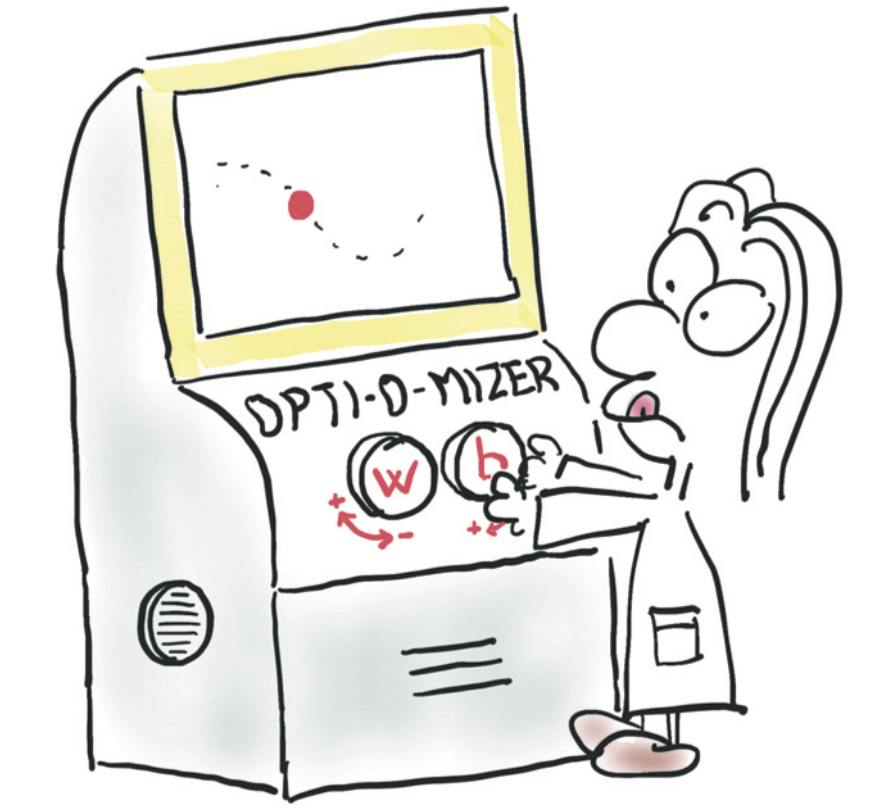
图4.4 对优化过程的卡通化描述，图中一个人用带有w和b的旋钮向使损耗减小的方向进行搜索

梯度下降没有太大不同，其想法是计算相对于每个参数的损失变化率，并沿损失减小的方向改变每个参数。当您摆弄旋钮时，可以通过对`w`和`b`进行很小的旋转来估计该变化率，以查看该邻域中的损失值变化了多少：

In [83]:
delta = 0.1
loss_rate_of_change_w = \
    (loss_fn(model(t_u, w + delta, b), t_c) -
     loss_fn(model(t_u, w - delta, b), t_c)) / (2.0 * delta)
loss_rate_of_change_w

tensor(4517.2979)

这段代码说的是，在`w`和`b`的当前值附近很小的范围内，`w`的单位增加会导致损失的某些变化。如果变化为负，则需要增加`w`以使损失最小，而如果变化为正，则需要减小`w`。减小多少呢？对`w`施加与损失的变化率成比例的变化是一个好主意，尤其是在损失具有多个参数的情况下：将变化应用于对损失有重大变化的参数。通常，缓慢地更改参数也是明智的做法，因为损失变化率可能会与当前`w`值的距离相差很大。因此，你应该用一个较小的因子来缩小变化率。这个因子有很多名称，机器学习中称之为学习率（learning rate）。

In [84]:
learning_rate = 1e-2
w = w - learning_rate * loss_rate_of_change_w

对`b`进行同样的操作：

In [85]:
loss_rate_of_change_b = \
    (loss_fn(model(t_u, w, b + delta), t_c) -
     loss_fn(model(t_u, w, b - delta), t_c)) / (2.0 * delta)
b = b - learning_rate * loss_rate_of_change_b

此代码表示梯度下降的基本参数更新步骤。通过不断重复这个步骤（假设你选择的学习率足够低），你可以收敛到参数的最佳值，对于该参数，根据给定数据计算出的损失最小。我们将很快展示完整的迭代过程，但是这种计算变化率的方法相当粗糙，需要改进。在下一小节中，你将了解原因和方式。

### 4.1.6 进行分析

通过重复评估模型和损失以搜索`w`和`b`附近的损失函数的行为来计算变化率，并不能很好地适应具有许多参数的模型。此外，并不总是很清楚该邻域应该有多大。之前选择的`delta`等于0.1，但是一切都取决于损失函数的尺寸。如果损失与`delta`相比变化得太快，那么你将对下降后的位置一无所知。

如图4.5所示，如果你可以使邻域无限小呢？这就是当你分析得出损失相对于参数的导数时发生的情况。在具有两个或多个参数的模型中，你将计算损失相对于每个参数的导数，并将它们放在导数向量中，即梯度。
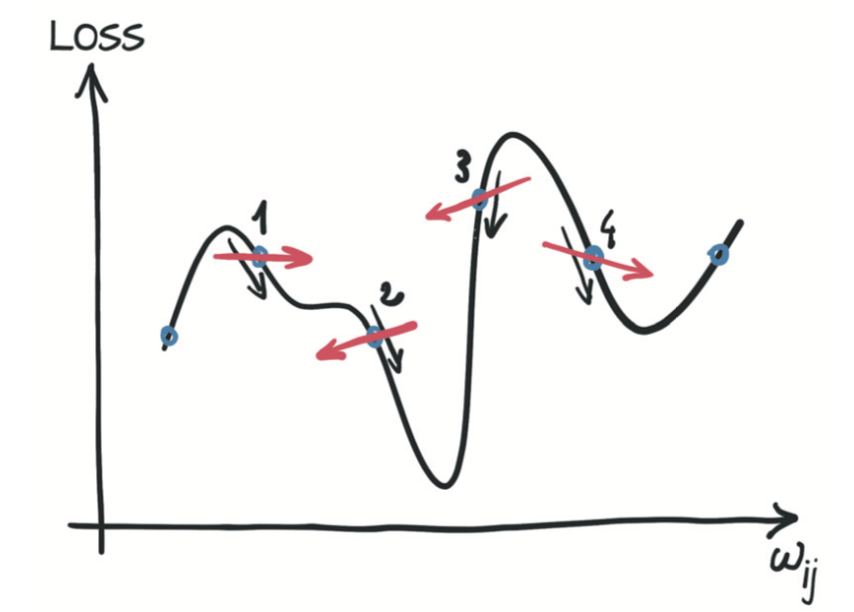

要计算损失值相对于参数的导数，你可以应用链式规则，计算损失函数相对于其输入（即模型的输出）的导数乘以模型相对于参数的导数。 参数：

$$
\frac { \text{loss_fn}} {\partial w} = 
\frac {\partial \text{loss_fn}} {\partial t_p} 
\frac {\partial t_p} {\partial w} 
$$

回想一下，该模型是线性函数，损失函数是平方和。现在计算出导数的表达式，先重写损失的表达式：
``` python
def loss_fn(t_p, t_c):
    squared_diffs = (t_p - t_c)**2
    return squared_diffs.mean()
```
因为 $ \frac {d x^2} {d x} = 2x$，所以
``` python
def dloss_fn(t_p, t_c):
    dsq_diffs = 2 * (t_p - t_c)
    return dsq_diffs
```
然后我们重写模型的表达式：
``` python
def model(t_u, w, b):
    return w * t_u + b
```
因此我们得到导数为
``` python
def dmodel_dw(t_u, w, b):
    return t_u

def dmodel_db(t_u, w, b):
    return 1.0
```
将所有这些放在一起，返回损失相对于`w`和`b`的梯度的函数
``` python
def grad_fn(t_u, t_c, t_p, w, b):
    dloss_dw = dloss_fn(t_p, t_c) * dmodel_dw(t_u, w, b)
    dloss_db = dloss_fn(t_p, t_c) * dmodel_db(t_u, w, b)
    return torch.stack([dloss_dw.mean(), dloss_db.mean()])
```

In [86]:
def loss_fn(t_p, t_c):
    squared_diffs = (t_p - t_c)**2
    return squared_diffs.mean()

def dloss_fn(t_p, t_c):
    dsq_diffs = 2 * (t_p - t_c)
    return dsq_diffs

def model(t_u, w, b):
    return w * t_u + b

def dmodel_dw(t_u, w, b):
    return t_u

def dmodel_db(t_u, w, b):
    return 1.0

def grad_fn(t_u, t_c, t_p, w, b):
    dloss_dw = dloss_fn(t_p, t_c) * dmodel_dw(t_u, w, b)
    dloss_db = dloss_fn(t_p, t_c) * dmodel_db(t_u, w, b)
    return torch.stack([dloss_dw.mean(), dloss_db.mean()])

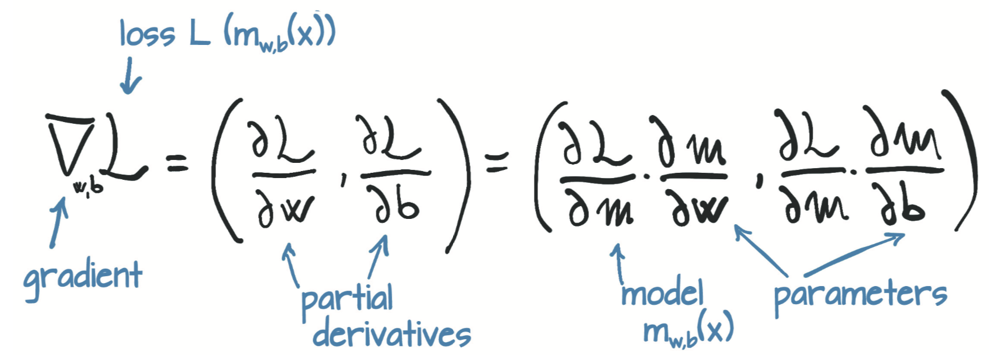

注：上述的模型并不是最终的情况，其只表示众多训练样本中的一个，
$$
    J(\theta) = \frac 1 m \sum_{i = 1} ^ m {({\hat y}^{(i)} - x^{(i)})^2}
$$

## 4.1.7 训练循环

现在，你已准备就绪，可以进行参数优化。从参数的暂定值开始，你可以迭代地对其应用更新以进行固定次数的迭代或者直到`w`和`b`停止改变为止。你可以使用多个停止条件，但是现在以固定迭代次数为例。

在讨论前，我们介绍另一个术语，在所有训练样本上的一次参数更新迭代称为一个epoch。

In [87]:
def training_loop(n_epochs, learning_rate, params, t_u, t_c, 
                    print_params = True, verbose=1):
    for epoch in range(1, n_epochs + 1):
        w, b = params

        t_p = model(t_u, w, b) # 前向传播
        loss = loss_fn(t_p, t_c)
        grad = grad_fn(t_u, t_c, t_p, w, b) # 反向传播

        params = params - learning_rate * grad

        if epoch % verbose == 0:
            print('Epoch %d, Loss %f' % (epoch, float(loss)))
            if print_params:
                print('    Params: ', params)
                print('    Grad  : ', grad)
    return params

In [88]:
training_loop(
            n_epochs = 10,
            learning_rate = 1e-2,
            params = torch.tensor([1.0, 0.0]),
            t_u = t_u,
            t_c = t_c)

Epoch 1, Loss 1763.884644
    Params:  tensor([-44.1730,  -0.8260])
    Grad  :  tensor([4517.2964,   82.6000])
Epoch 2, Loss 5802484.500000
    Params:  tensor([2568.4011,   45.1637])
    Grad  :  tensor([-261257.4062,   -4598.9707])
Epoch 3, Loss 19408031744.000000
    Params:  tensor([-148527.7344,   -2616.3933])
    Grad  :  tensor([15109615.0000,   266155.7188])
Epoch 4, Loss 64915909902336.000000
    Params:  tensor([8589997.0000,  151310.8750])
    Grad  :  tensor([-8.7385e+08, -1.5393e+07])
Epoch 5, Loss 217130439561707520.000000
    Params:  tensor([-4.9680e+08, -8.7510e+06])
    Grad  :  tensor([5.0539e+10, 8.9023e+08])
Epoch 6, Loss 726257020202974707712.000000
    Params:  tensor([2.8732e+10, 5.0610e+08])
    Grad  :  tensor([-2.9229e+12, -5.1486e+10])
Epoch 7, Loss 2429181687085405986357248.000000
    Params:  tensor([-1.6617e+12, -2.9270e+10])
    Grad  :  tensor([1.6904e+14, 2.9776e+12])
Epoch 8, Loss 8125117236949438203699396608.000000
    Params:  tensor([9.6102e+13, 1

tensor([3.2144e+17, 5.6621e+15])

等等，发生什么了？训练过程崩溃了，导致损失变成了无穷大。这个结果清楚地展现了参数params的更新太大；它们的值在每次更新过头时开始来回摆动，而下次更新则摆动更剧烈。优化过程不稳定，它发散了而不是收敛到最小值。你希望看到越来越小的参数更新，而不是越来越大，如图4.7所示。

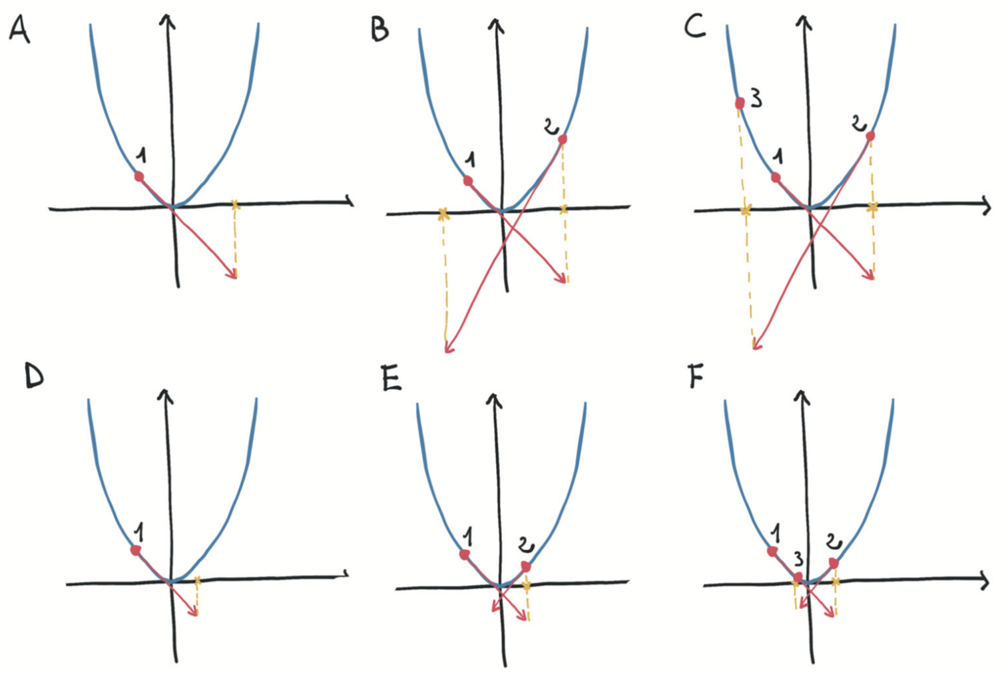

等等，发生什么了？训练过程崩溃了，导致损失变成了无穷大。这个结果清楚地展现了参数`params`的更新太大；它们的值在每次更新过头时开始来回摆动，而下次更新则摆动更剧烈。优化过程不稳定，它发散了而不是收敛到最小值。你希望看到越来越小的参数更新，而不是越来越大，如图4.7所示。

In [89]:
training_loop(
            n_epochs = 10,
            learning_rate = 1e-4,
            params = torch.tensor([1.0, 0.0]),
            t_u = t_u,
            t_c = t_c)

Epoch 1, Loss 1763.884644
    Params:  tensor([ 0.5483, -0.0083])
    Grad  :  tensor([4517.2964,   82.6000])
Epoch 2, Loss 323.090546
    Params:  tensor([ 0.3623, -0.0118])
    Grad  :  tensor([1859.5493,   35.7843])
Epoch 3, Loss 78.929634
    Params:  tensor([ 0.2858, -0.0135])
    Grad  :  tensor([765.4666,  16.5122])
Epoch 4, Loss 37.552845
    Params:  tensor([ 0.2543, -0.0143])
    Grad  :  tensor([315.0790,   8.5787])
Epoch 5, Loss 30.540285
    Params:  tensor([ 0.2413, -0.0149])
    Grad  :  tensor([129.6733,   5.3127])
Epoch 6, Loss 29.351152
    Params:  tensor([ 0.2360, -0.0153])
    Grad  :  tensor([53.3496,  3.9682])
Epoch 7, Loss 29.148882
    Params:  tensor([ 0.2338, -0.0156])
    Grad  :  tensor([21.9304,  3.4148])
Epoch 8, Loss 29.113848
    Params:  tensor([ 0.2329, -0.0159])
    Grad  :  tensor([8.9964, 3.1869])
Epoch 9, Loss 29.107145
    Params:  tensor([ 0.2325, -0.0162])
    Grad  :  tensor([3.6721, 3.0930])
Epoch 10, Loss 29.105242
    Params:  tensor([ 0.23

tensor([ 0.2324, -0.0166])

漂亮，现在优化过程是稳定的了。但是还有另一个问题：参数的更新很小，因此损失会缓慢下降并最终停滞。你可以通过动态调整`learning_rate`来解决此问题，即根据更新的大小对学习率进行更改。为此，可以使用多种优化方案，你会在本章末尾的“优化器”小节看到一个。

在更新过程中另一个潜在的麻烦是：梯度本身。观察优化过程中第1个epoch的梯度`grad`值，此时权重`w`的梯度大约是偏差`b`梯度的50倍，因此权重和偏差存在于不同比例的空间中。在这种情况下，足够大的学习率足以有意义地更新一个，但对于另一个不稳定，或者适合第二个学习者的学习率不足以有意义地更新第一个。此时除非你更改问题的描述，否则你将无法更新参数。你可以为每个参数设置单独的学习率，但是对于具有许多参数的模型，此方法将非常麻烦。

可以采用一种更简单的方法：更改输入使梯度差别不要太大。粗略地说，你可以确保输入不要与范围-1.0到1.0相差过大。在本例中，你可以通过将`t_u`乘以0.1来达到此效果：

In [90]:
t_un = 0.1 * t_u

training_loop(
    n_epochs = 10,
    learning_rate = 1e-2,
    params = torch.tensor([1.0, 0.0]),
    t_u = t_un, # 规范化后的输入
    t_c = t_c)


Epoch 1, Loss 80.364342
    Params:  tensor([1.7761, 0.1064])
    Grad  :  tensor([-77.6140, -10.6400])
Epoch 2, Loss 37.574917
    Params:  tensor([2.0848, 0.1303])
    Grad  :  tensor([-30.8623,  -2.3864])
Epoch 3, Loss 30.871077
    Params:  tensor([2.2094, 0.1217])
    Grad  :  tensor([-12.4631,   0.8587])
Epoch 4, Loss 29.756193
    Params:  tensor([2.2616, 0.1004])
    Grad  :  tensor([-5.2218,  2.1327])
Epoch 5, Loss 29.507149
    Params:  tensor([2.2853, 0.0740])
    Grad  :  tensor([-2.3715,  2.6310])
Epoch 6, Loss 29.392458
    Params:  tensor([2.2978, 0.0458])
    Grad  :  tensor([-1.2492,  2.8241])
Epoch 7, Loss 29.298828
    Params:  tensor([2.3059, 0.0168])
    Grad  :  tensor([-0.8071,  2.8970])
Epoch 8, Loss 29.208717
    Params:  tensor([ 2.3122, -0.0124])
    Grad  :  tensor([-0.6325,  2.9227])
Epoch 9, Loss 29.119417
    Params:  tensor([ 2.3178, -0.0417])
    Grad  :  tensor([-0.5633,  2.9298])
Epoch 10, Loss 29.030487
    Params:  tensor([ 2.3232, -0.0710])
    Gra

tensor([ 2.3232, -0.0710])

即使学习率被设置为`1e-2`，在迭代更新过程中参数也不会发散。现在注意梯度值，它们的大小相似，因此对两个参数使用单个`learning_rate`效果也还不错。你可能会有比将输入缩小十倍更好的规范化方法，但由于这样做足以满足需求，所以我们就这样做。

> 注：这里的规范化可以帮助训练网络，但是你可以说这并不是优化参数必须的。确实是这样的！这个例子很简单，你有很多其他方法可以解决这个问题。但是，对于更复杂的问题，规范化是一种用于改善模型收敛性的简便有效的（即使不是至关重要的）工具。

接下来，运行循环进行足够的迭代次数以查看参数的变化。
将n_epochs更改为5000：

Epoch 500, Loss 7.860116
Epoch 1000, Loss 3.828538
Epoch 1500, Loss 3.092191
Epoch 2000, Loss 2.957697
Epoch 2500, Loss 2.933134
Epoch 3000, Loss 2.928648
Epoch 3500, Loss 2.927831
Epoch 4000, Loss 2.927680
Epoch 4500, Loss 2.927651
Epoch 5000, Loss 2.927648


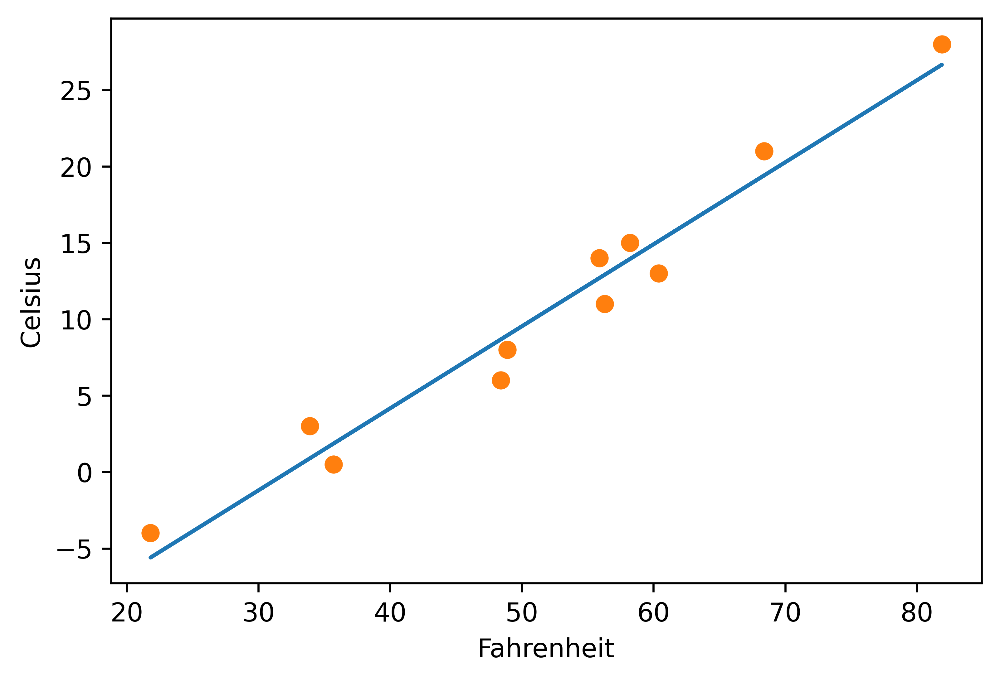

In [91]:
params = training_loop(
    n_epochs = 5000,
    learning_rate = 1e-2,
    params = torch.tensor([1.0, 0.0]),
    t_u = t_un,
    t_c = t_c,
    print_params = False,
    verbose=500)

%matplotlib inline
from matplotlib import pyplot as plt

t_p = model(t_un, *params) # 记住你是在规范后数据上训练的

fig = plt.figure(dpi=600)
plt.xlabel("Fahrenheit")
plt.ylabel("Celsius")

plt.plot(t_u.numpy(), t_p.detach().numpy()) # 在原数据上作图
plt.plot(t_u.numpy(), t_c.numpy(), 'o')


# 4.2 PyTorch自动求导

到目前为止，你已经了解了一个反向传播的简单示例。通过链式法则向后传播导数，可以计算复合函数（模型函数和损失函数）相对于它们的最内层参数`w`和`b`的梯度。基本的要求是涉及到的函数都是可微分的。在这种情况下，你可以通过一次扫描得到梯度（之前称为“损失变化率”）值。

如果你有一个具有数百万个参数的复杂模型，只要模型是可微的，损失函数相对于参数的梯度的计算就相当于编写导数的解析表达式并对其进行一次评估（evaluation）。当然，为由线性和非线性函数组成的复杂函数的导数编写解析表达式并不是一件很有趣的事情，也不是一件很容易的事情。

这个问题可以通过一个名为`autograd`的PyTorch模块来解决。PyTorch张量可以记住它们来自什么运算以及其起源的父张量，并且提供相对于输入的导数链。你无需手动对模型求导：不管如何嵌套，只要你给出前向传播表达式，PyTorch都会自动提供该表达式相对于其输入参数的梯度。

本例中，我们先重写温度计校准代码，这次使用`autograd`，然后看会发生什么。首先，定义模型和损失函数，如下所示。

In [92]:
def model(t_u, w, b):
    return w * t_u + b

def loss_fn(t_p, t_c):
    squared_diffs = (t_p - t_c)**2
    return squared_diffs.mean()

然后初始化参数张量：

In [93]:
params = torch.tensor([1.0, 0.0], requires_grad=True)

注意到了张量构造函数的`require_grad = True`吗?这个参数告诉PyTorch需要追踪在`params`上进行运算而产生的所有张量。换句话说，任何以`params`为祖先的张量都可以访问从`params`到该张量所调用的函数链。如果这些函数是可微的（大多数PyTorch张量运算都是可微的），则导数的值将自动存储在参数张量的`grad`属性中。

一般来讲，所有PyTorch张量都有一个初始为空的名为`grad`的属性：

In [94]:
params.grad is None # True

True

你需要做的就是从将`require_grad`设置为True开始，然后调用模型，计算损失值，然后对损失张量`loss`调用`backward`：

In [95]:
loss = loss_fn(model(t_u, *params), t_c)
loss.backward()
params.grad

tensor([4517.2969,   82.6000])

本例中，`params`的`grad`属性包含损失关于`params`的每个元素的导数（图4.9）。

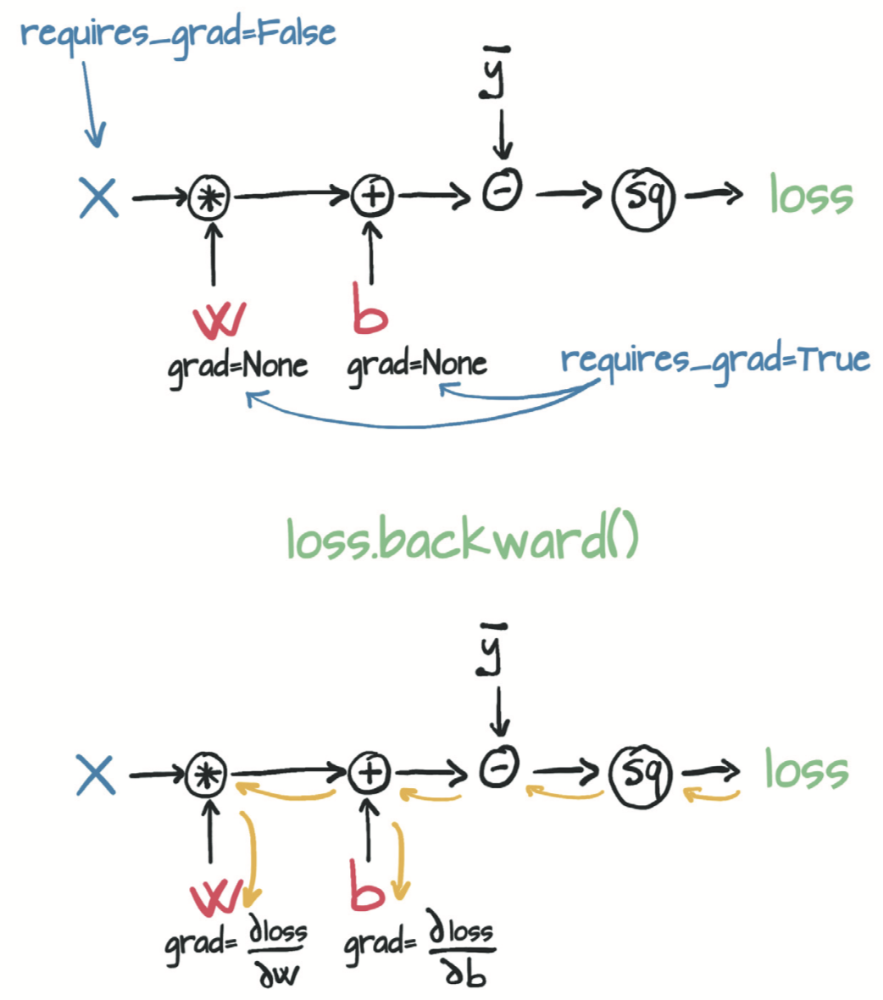

你可以将包含任意数量的张量的`require_grad`设置为`True`以及组合任何函数。在这种情况下，PyTorch会在沿着整个函数链（即计算图）计算损失的导数，并在这些张量（即计算图的叶节点）的`grad`属性中将这些导数值累积（accumulate）起来。

警告：PyTorch的新手（以及很多经验丰富的人）经常忽视的事情：是积累（accumulate）而不是存储（store）。

> 警告：调用`backward`会导致导数值在叶节点处累积。所以将其用于参数更新后，需要将梯度显式清零。

重复调用`backward`会导致导数在叶节点处累积。因此，如果提前调用了`backward`，然后再次计算损失并再次调用`backward`（如在训练循环中一样），那么在每个叶节点上的梯度会被累积（即求和）在前一次迭代计算出的那个叶节点上，导致梯度值不正确。

为防止这种情况发生，你需要在每次迭代时将梯度显式清零。可以使用就地方法`zero_`轻松地做到这一点：

In [96]:
if params.grad is not None:
    params.grad.zero_()

> 注：你可能会很好奇为什么在每次调用`backward`后将梯度清零是必需的步骤而不是自动进行的步骤。原因是为复杂模型中的梯度提供更大的灵活性和可控制性。

牢牢记住这个提醒，现在从头到尾看看启用了`autograd`的训练代码的样子：

In [97]:
def training_loop(n_epochs, learning_rate, params, t_u, t_c):
    for epoch in range(1, n_epochs + 1):
        if params.grad is not None: 
            params.grad.zero_() # 这可以在调用backward之前在循环中的任何时候完成
        t_p = model(t_u, *params)
        loss = loss_fn(t_p, t_c)
        loss.backward()
        params = (params - learning_rate * params.grad).detach().requires_grad_()
        if epoch % 500 == 0:
            print('Epoch %d, Loss %f' % (epoch, float(loss)))
    return params

请注意，更新参数时，你还执行了奇怪的`.detach().requires_grad_()`。要了解原因，请考虑一下你构建的计算图。为了避免重复使用变量名，我们重构`params`参数更新行：`p1 = (p0 * lr * p0.grad)`。这里`p0`是用于初始化模型的随机权重，`p0.grad`是通过损失函数根据`p0`和训练数据计算出来的。

到目前为止，一切都很好。现在，你需要进行第二次迭代：`p2 = (p1 * lr * p1.grad)`。如你所见，`p1`的计算图会追踪到`p0`，这是有问题的，因为(a)你需要将`p0`保留在内存中（直到训练完成），并且(b)在反向传播时不知道应该如何分配误差。

相反，应该通过调用`.detatch()`将新的`params`张量从与其更新表达式关联的计算图中分离出来。这样，`params`就会丢失关于生成它的相关运算的记忆。然后，你可以调用`.requires_grad_()`，这是一个就地（in place）操作（注意下标“_”），以重新启用张量的自动求导。现在，你可以释放旧版本`params`所占用的内存，并且只需通过当前权重进行反向传播。

注：lr是learnig rate

In [98]:
t_un = 0.1 * t_u
training_loop(
    n_epochs = 5000,
    learning_rate = 1e-2,
    params = torch.tensor([1.0, 0.0], requires_grad=True),
    t_u = t_un,
    t_c = t_c)

Epoch 500, Loss 7.860116
Epoch 1000, Loss 3.828538
Epoch 1500, Loss 3.092191
Epoch 2000, Loss 2.957697
Epoch 2500, Loss 2.933134
Epoch 3000, Loss 2.928648
Epoch 3500, Loss 2.927830
Epoch 4000, Loss 2.927679
Epoch 4500, Loss 2.927652
Epoch 5000, Loss 2.927647


tensor([  5.3671, -17.3012], requires_grad=True)

### 4.2.1 优化器
此代码使用最基础的梯度下降进行优化，这在简单情况下效果很好。你可能已经猜到，存在几种优化策略和技巧可以帮助收敛，特别是当模型变得复杂时。

现在是时候介绍PyTorch从用户代码（例如训练循环）中抽象出来的优化策略了，以使你免于繁琐地更新模型中的每个参数。`torch`模块有一个`optim`子模块，你可以在其中找到实现不同优化算法的类。这里有一个简短的清单：

In [99]:
import torch.optim as optim
dir(optim)

['ASGD',
 'Adadelta',
 'Adagrad',
 'Adam',
 'AdamW',
 'Adamax',
 'LBFGS',
 'Optimizer',
 'RMSprop',
 'Rprop',
 'SGD',
 'SparseAdam',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'lr_scheduler']

每个优化器构造函数都将参数（通常是将`require_grad`设置为True的PyTorch张量）作为第一个输入。传递给优化器的所有参数都保留在优化器对象内，以便优化器可以更新其值并访问其`grad`属性，如图4.10所示。

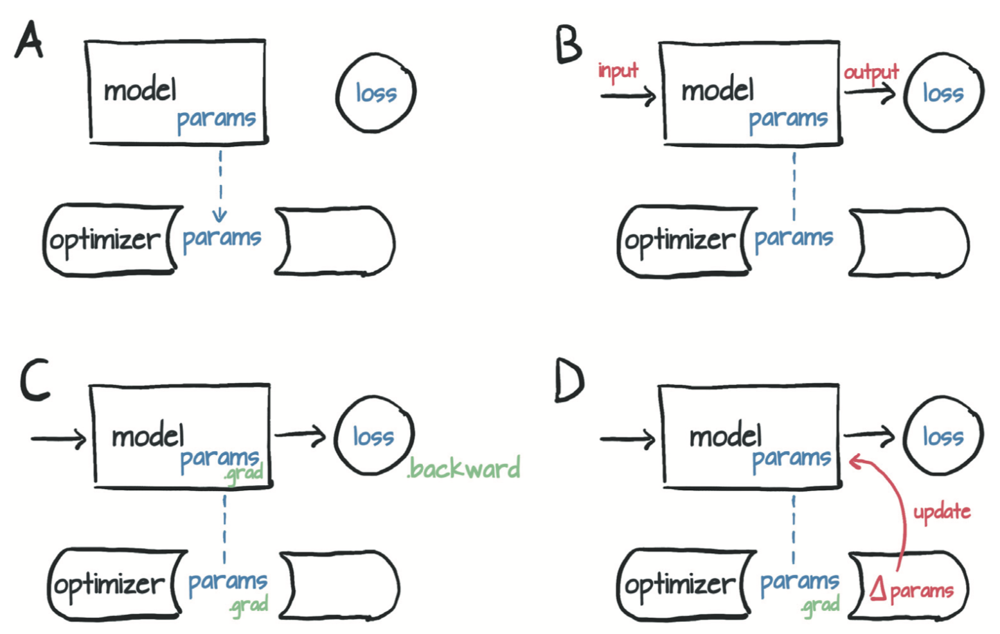

图4.10 （A）优化器对参数的引用的概念表示，然后（B）根据输入计算损失，（C）对backward的调用会将grad填充到参数内。此时，（D）优化器可以访问grad并计算参数更新。

每个优化器都有两个方法：`zero_grad`和`step`。前者将构造时传递给优化器的所有参数的`grad`属性归零；后者根据特定优化器实施的优化策略更新这些参数的值。
现在创建参数并实例化一个梯度下降优化器：

In [100]:
params = torch.tensor([1.0, 0.0], requires_grad=True)
learning_rate = 1e-5
optimizer = optim.SGD([params], lr=learning_rate)

这里，SGD代表随机梯度下降（Stochastic Gradient Descent）。这里的优化器采用原始（vanilla）的梯度下降（只要动量`momentum`设置为默认值0.0）。术语“随机”（stochastic）来自以下事实：通常是通过平均输入样本的随机子集（称为minibatch）产生的梯度来获得最终梯度。然而，优化器本身并不知道是对所有样本（vanilla）还是对其随机子集（stochastic）进行了损失评估，因此两种情况下的算法相同。

无论如何，下面来尝试使用新的优化器：

In [101]:
t_p = model(t_u, *params)
loss = loss_fn(t_p, t_c)
loss.backward()
optimizer.step()
params

tensor([ 9.5483e-01, -8.2600e-04], requires_grad=True)

调用`step`后`params`的值就会更新，无需亲自更新它！调用`step`发生的事情是：优化器通过将`params`减去`learning_rate`与`grad`的乘积来更新的`params`，这与之前手动编写的更新过程完全相同。

准备好将此代码放在训练循环中了吗？不！需要注意一个大陷阱：不要忘了将梯度清零。如果你在循环中调用了前面的代码，则在每次调用`backward`时，梯度都会在叶节点中累积且会传播得到处都是！

以下就是准备循环的代码，需要在正确的位置（在调用`backward`之前）插入额外的`zero_grad`：

In [102]:
params = torch.tensor([1.0, 0.0], requires_grad=True)
learning_rate = 1e-2
optimizer = optim.SGD([params], lr=learning_rate)
t_p = model(t_un, *params)
loss = loss_fn(t_p, t_c)
optimizer.zero_grad() # 此调用可以在循环中更早的位置
loss.backward()
optimizer.step()
params

tensor([1.7761, 0.1064], requires_grad=True)

完美！这就是`optim`模块如何抽象出特定的优化方法。你所要做的就是为其提供一个参数的列表（根据深度神经网络模型的需要，该列表可能很长），然后忽略所有细节。

因此训练循环代码如下：

In [103]:
def training_loop(n_epochs, optimizer, params, t_u, t_c):
    for epoch in range(1, n_epochs + 1):
        t_p = model(t_u, *params)
        loss = loss_fn(t_p, t_c)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if epoch % 500 == 0:
            print('Epoch %d, Loss %f' % (epoch, float(loss)))
    return params

params = torch.tensor([1.0, 0.0], requires_grad=True)
learning_rate = 1e-2
optimizer = optim.SGD([params], lr=learning_rate)

training_loop(
    n_epochs = 5000,
    optimizer = optimizer,
    params = params,
    t_u = t_un,
    t_c = t_c)

Epoch 500, Loss 7.860116
Epoch 1000, Loss 3.828538
Epoch 1500, Loss 3.092191
Epoch 2000, Loss 2.957697
Epoch 2500, Loss 2.933134
Epoch 3000, Loss 2.928648
Epoch 3500, Loss 2.927830
Epoch 4000, Loss 2.927679
Epoch 4500, Loss 2.927652
Epoch 5000, Loss 2.927647


tensor([  5.3671, -17.3012], requires_grad=True)

你再次得到了与以前相同的结果。不错。你进一步确认了你知道如何手动进行梯度下降！为了测试更多优化器，你只需要实例化一个不同的优化器，例如Adam而不是SGD，其余代码保持原样就可以了。所以这个模块很方便。

这里不会详细介绍Adam，你现在只需要知道它自适应地设置学习率，是一种更加复杂的优化器。此外，它对参数缩放的敏感度很低，以至于你可以使用原始（非标准化）输入`t_u`甚至将学习率提高到1e-1：

In [104]:
params = torch.tensor([1.0, 0.0], requires_grad=True)
learning_rate = 1e-1
optimizer = optim.Adam([params], lr=learning_rate)

training_loop(
    n_epochs = 2000,
    optimizer = optimizer,
    params = params,
    t_u = t_u,
    t_c = t_c)

Epoch 500, Loss 7.612901
Epoch 1000, Loss 3.086700
Epoch 1500, Loss 2.928578
Epoch 2000, Loss 2.927646


tensor([  0.5367, -17.3021], requires_grad=True)

优化器并不是训练循环中唯一灵活的部分。现在将注意力转移到模型上。为了在相同的数据上使用相同的损失训练神经网络，你只需更改函数`model`即可。不过在当前例子中，这样做是没有意义的，因为我们已经知道将摄氏温度转换为华氏温度就是线性变换。神经网络可以去除你关于近似函数的任意假设。即使内在的映射过程是高度非线性的（例如，用句子描述图像），神经网络也会设法进行训练。

我们已经接触了许多基本概念，使你可以在训练复杂的深度学习模型的同时了解内在情况：反向传播以估计梯度，自动求导以及通过使用梯度下降或其他优化器优化模型的权重。我们要讲的没有多少了，剩余要讲的大部分填补了空白区，无论它有多广泛。

接下来，我们讨论如何划分样本，从而为学习更好地控制自动求导建立了一个完美的例子。

## 4.2.2 训练、验证和过拟合

开普勒（Johannes Kepler）将部分数据保留在一边，以便他可以在独立的观察结果上验证他的模型，这是一件至关重要的事情，尤其是当你采用的模型可以拟合任何形状的函数时，例如在神经网络中。换句话说，适应性强的模型倾向于使用其许多参数来确保在训练数据上的损失最小，但是你无法保证该模型在远离训练数据或在训练数据之间的数据上表现良好。

你让优化器做的是：最大程度地减少训练数据上的损失。果然，如果你有独立于训练之外而不是用来评估损失或进行梯度下降的数据，那么你很快就会发现，在这些独立的数据上评估会产生高于预期的损失。我们之前已经提到过这种现象，我们将其称为过拟合（overfitting）。

你防止过拟合的第一步是认识到过拟合可能会发生。为此，正如开普勒（Kepler）在1600年指出的那样，你必须从数据集中划分出一些数据（验证集），然后将模型在其他数据（训练集）上进行拟合，如图4.11所示。然后，在拟合模型时，你可以在训练集评估一次损失，然后在验证集上评估一次损失（但不进行参数更新）。当你尝试确定是否已将模型很好地拟合数据时，请务必查看每个数据集！

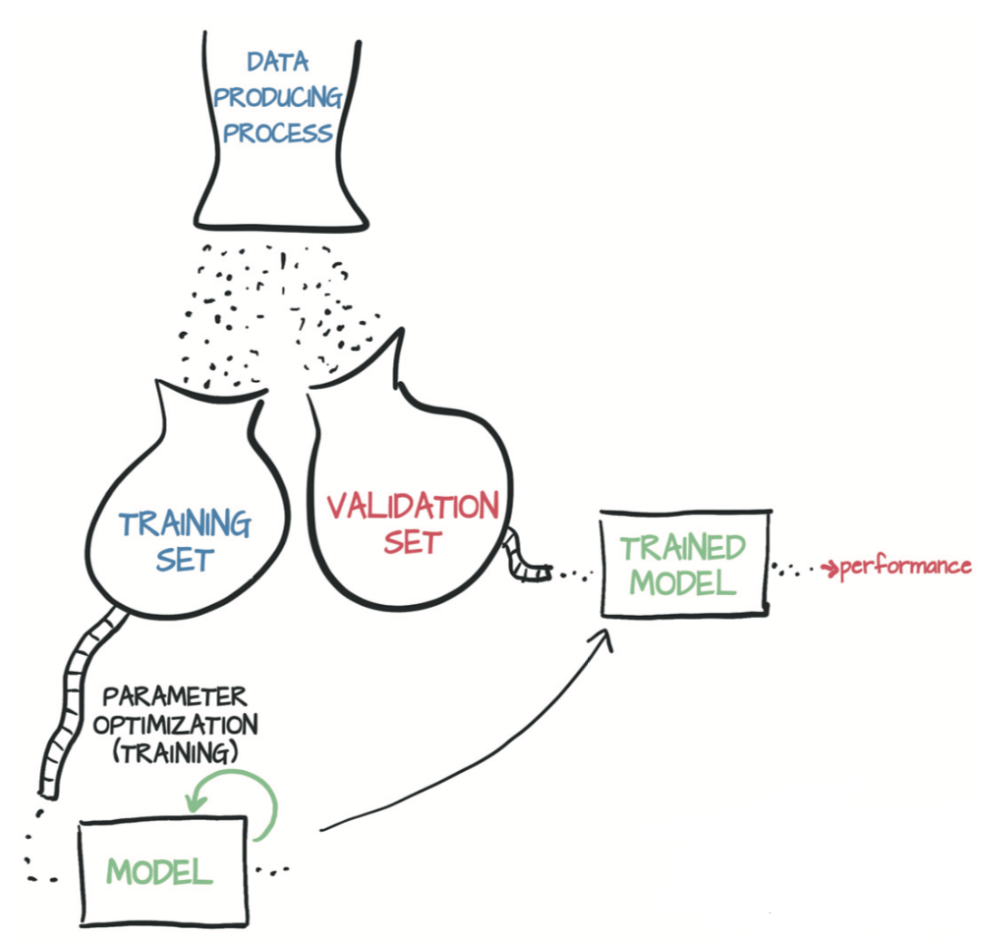

训练损失告诉模型是否完全适合训练集，换句话说，模型是否具有足够的能力来处理训练数据中的相关信息。如果你的温度计设法通过使用对数刻度来测量温度，那么糟糕的线性模型将没有机会拟合这些测量值所以无法正确地转换为摄氏度。在这种情况下，你的训练损失（训练循环中打印的损失）将在接近零之前停止下降。

深度神经网络可以近似复杂的函数，前提是神经元的数量（即参数量）足够高。参数越少，网络能够近似的函数越简单。因此，这里有一条规律：如果训练损失没有减少，则该模型对于数据来说太简单了。另一种可能性是训练数据中不包含有意义的信息以用于预测输出。如果店家卖给你的是气压计而不是温度计，那么即使你使用[Quebec](https://www.umontreal.ca/en/artificialintelligence)的最新神经网络架构，仅凭气压也无法预测摄氏温度。

在验证集上的损失呢？好吧，如果在验证集中评估的损失没有随训练集一起减少，则你的模型正在改善其在训练过程中看到的样本的拟合度，但并没有将其泛化（generalize）到训练集之外的样本，当你在新的（训练时没见过的）数据上评估模型时，损失值就很高。这是第二条规律：如果训练损失和验证损失分道扬镳（diverge）了，则说明模型过拟合了。

这里我们以温度计为例来深入研究这种现象。你可能已经决定使用更复杂的函数（例如分段多项式函数或大型神经网络）来拟合数据。如图4.12所示，该函数可以产生一个蜿蜒穿过数据点的模型，因为这样损失会逼近于零。由于函数远离数据点的行为不会使损失降低，因此不能使模型远离训练数据点。

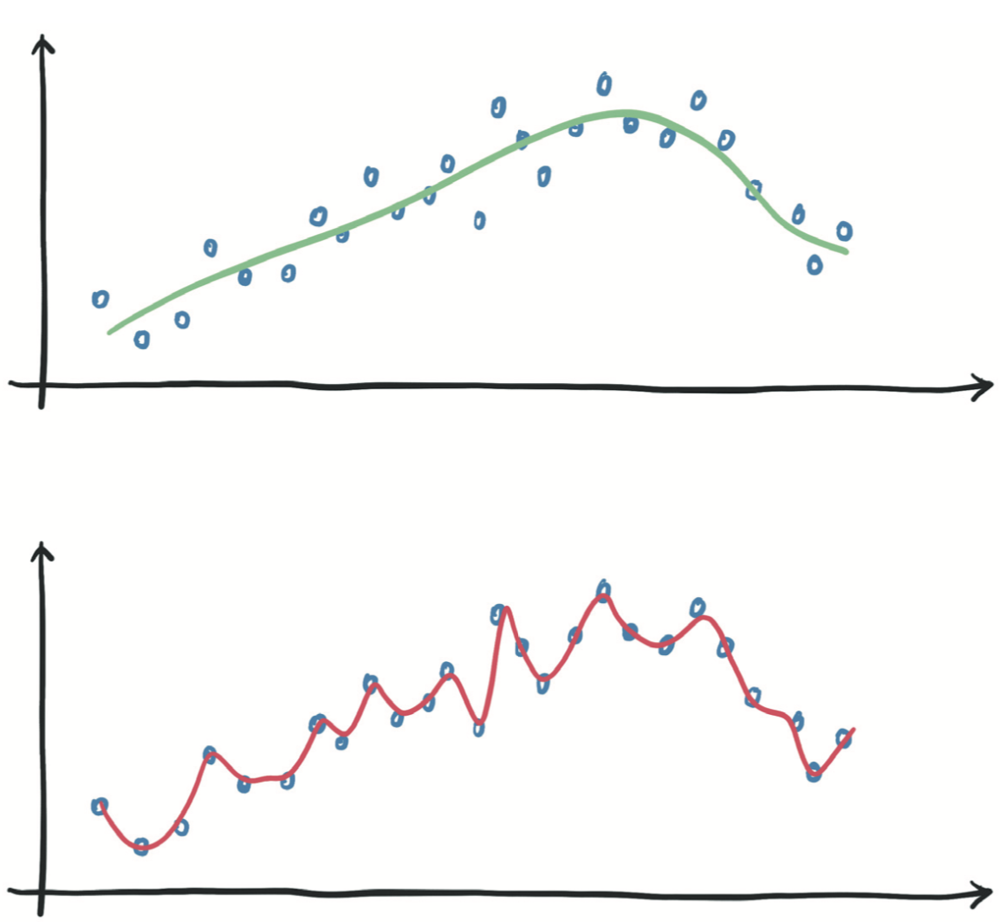
有什么办法防止过拟合？好问题。过拟合似乎是这样一个问题：确保模型在数据点之间的行为对于你尝试近似的过程是明智的（原句：Overfitting looks like a problem of making sure that the behavior of the model in between data points is sensible for the process you’re trying approximate.）。首先，你应确保为该过程获取了足够多的数据。如果你以很低频率从正弦过程中采样来收集数据，那么你很难让模型拟合这些数据。

假设你有足够多的数据，则应确保能够拟合训练数据的模型在数据点之间尽可能正则化（regular）。你有几种方法可以实现此目标：一种方法是在损失函数中添加所谓的惩罚项，以使模型的行为更平稳，变化更慢（到一定程度）；另一种方法是向输入样本添加噪声，在训练数据样本之间人为地创建新的数据，并迫使模型也尝试拟合它们。还有几种与这两种方法有些相关的方式。不过你可以为自己做的最大努力，至少作为第一步，就是简化你的模型。从直观的角度来看，较为简单的模型可能无法像较复杂的模型那样完美地拟合训练数据而是在训练数据上表现得更加正则。

这里有一些不错的权衡。一方面，你需要模型对训练集具有足够的拟合能力。另一方面，你需要模型避免过拟合。因此，选择正确大小（就参数而言）的神经网络模型基于两个步骤：增大模型大小直到成功拟合数据，然后逐渐缩小直到不再过拟合。

你应该做的就是在拟合和过拟合之间的平衡。你可以通过以相同的方式对`t_u`和`t_c`进行打乱，然后将生成的数据随机分为两部分从而得到训练集和验证集。

对张量的元素进行打乱等价于重新排列其索引。`randperm`函数完成了这个操作：


In [105]:
n_samples = t_u.shape[0]
n_val = int(0.2 * n_samples)

shuffled_indices = torch.randperm(n_samples)
train_indices = shuffled_indices[:-n_val]
val_indices = shuffled_indices[-n_val:]

train_indices, val_indices # 划分结果是随机的

(tensor([10,  9,  4,  0,  2,  3,  5,  1,  6]), tensor([7, 8]))

你获得了可用于从数据张量构建训练集和验证集的索引：

In [106]:
train_t_u = t_u[train_indices]
train_t_c = t_c[train_indices]

val_t_u = t_u[val_indices]
val_t_c = t_c[val_indices]

train_t_un = 0.1 * train_t_u
val_t_un = 0.1 * val_t_u

训练循环代码和之前一样，额外添加了评估每个epoch的验证损失以便查看是否过度拟合：

In [107]:
def training_loop(n_epochs, optimizer, params, 
                  train_t_u, val_t_u, train_t_c, val_t_c):
    for epoch in range(1, n_epochs + 1):
        train_t_p = model(train_t_u, *params)
        train_loss = loss_fn(train_t_p, train_t_c)

        val_t_p = model(val_t_u, *params)
        val_loss = loss_fn(val_t_p, val_t_c)

        optimizer.zero_grad()
        train_loss.backward() # 注意没有val_loss.backward因为不能在验证集上训练模型
        optimizer.step()

        if epoch <= 3 or epoch % 500 == 0:
            print('Epoch %d, Training loss %.2f, Validation loss %.2f' % (
                    epoch, float(train_loss), float(val_loss)))
    return params

params = torch.tensor([1.0, 0.0], requires_grad=True)
learning_rate = 1e-2
optimizer = optim.SGD([params], lr=learning_rate)

training_loop(
    n_epochs = 3000,
    optimizer = optimizer,
    params = params,
    train_t_u = train_t_un,
    val_t_u = val_t_un,
    train_t_c = train_t_c,
    val_t_c = val_t_c)


Epoch 1, Training loss 93.83, Validation loss 19.77
Epoch 2, Training loss 30.66, Validation loss 42.20
Epoch 3, Training loss 23.95, Validation loss 55.47
Epoch 500, Training loss 8.80, Validation loss 19.46
Epoch 1000, Training loss 4.36, Validation loss 7.78
Epoch 1500, Training loss 3.01, Validation loss 5.19
Epoch 2000, Training loss 2.59, Validation loss 4.95
Epoch 2500, Training loss 2.46, Validation loss 5.18
Epoch 3000, Training loss 2.42, Validation loss 5.41


tensor([  5.4727, -17.7369], requires_grad=True)

这里，我们对模型并不完全公平，因为验证集很小，所以验证损失仅在一定程度上有意义。无论如何请注意，验证损失最后比训练损失高，尽管幅度不大。由于模型参数是由训练集决定的，可以预见模型在训练集上表现更好这个事实，不过你的主要目标是同时减少训练损失和验证损失。尽管在理想情况下两个损失应该大致相等，即验证损失与训练损失很接近，但是（当两个损失没有大致相等时）模型（也可能）正在继续学习有关数据的一般化知识。在图4.13中，情况C是理想的，而情况D是可接受的。在情况A中，模型根本没有学习，而在情况B中，出现了过拟合。

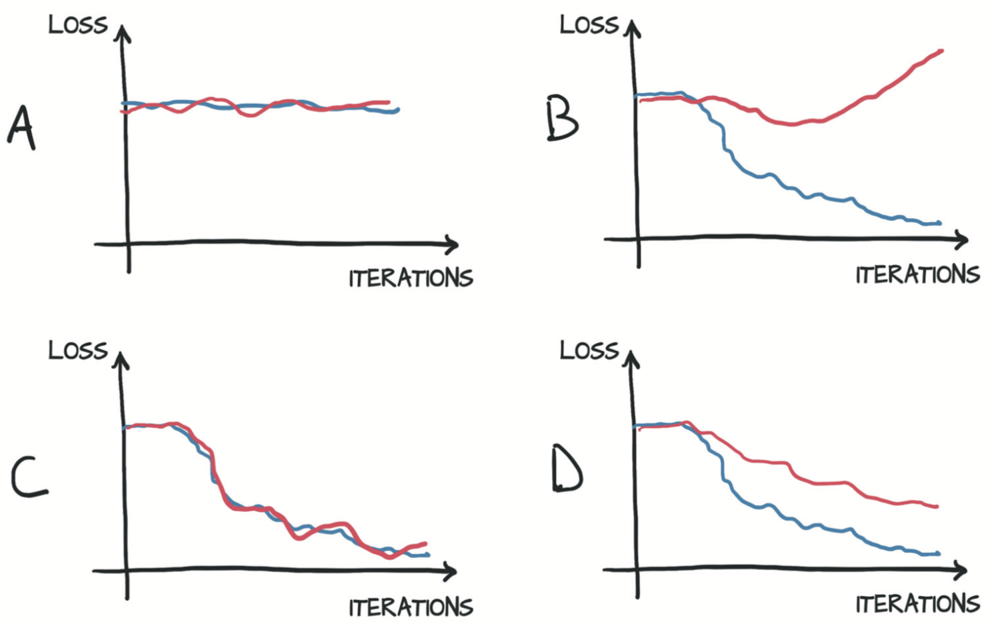

图4.13 训练（蓝色）和验证（红色）损失曲线图。（A）训练和验证损失没有下降；由于数据中没有信息或模型拟合能力不足，该模型无法学习。（B）训练损失下降而验证损失增加（过拟合）。（C）训练和验证损失同步减少；由于模型并非处于过拟合的极限，因此性能可能会进一步提高。（D）训练和验证损失具有不同的绝对值但趋势相似；过拟合在可控之内。

## 4.2.3 不需要时关闭`autograd`

从训练循环中，你注意到只能在`train_loss`上调用`backward`。因此，误差只会根据训练集来进行反向传播。验证集用于在未用于训练的数据上对模型输出的准确性进行独立的评估。

好奇的读者此时可能会有一个问题。我们对模型进行了两次评估（一次在`train_t_u`上，一次在`val_t_u`上），然后调用一次`backward`。这不会使`autograd`变得混乱吗？验证集评估过程中生成的值不会影响`backward`吗？

幸运的是，事实并非如此。训练循环中的第一行在`train_t_u`上对模型进行评估以产生`train_t_p`。然后用`train_t_p`计算`train_loss`，创建一个链接从`train_t_u`到`train_t_p`再到`train_loss`的计算图。当在`val_t_u`上再次评估模型然后生成`val_t_p`和`val_loss`时，将创建一个单独的计算图，该图链接从`val_t_u`到`val_t_p`再到`val_loss`。单独的张量通过相同的函数`model`和`loss_fn`运行，生成了单独的计算图，如图4.14所示。

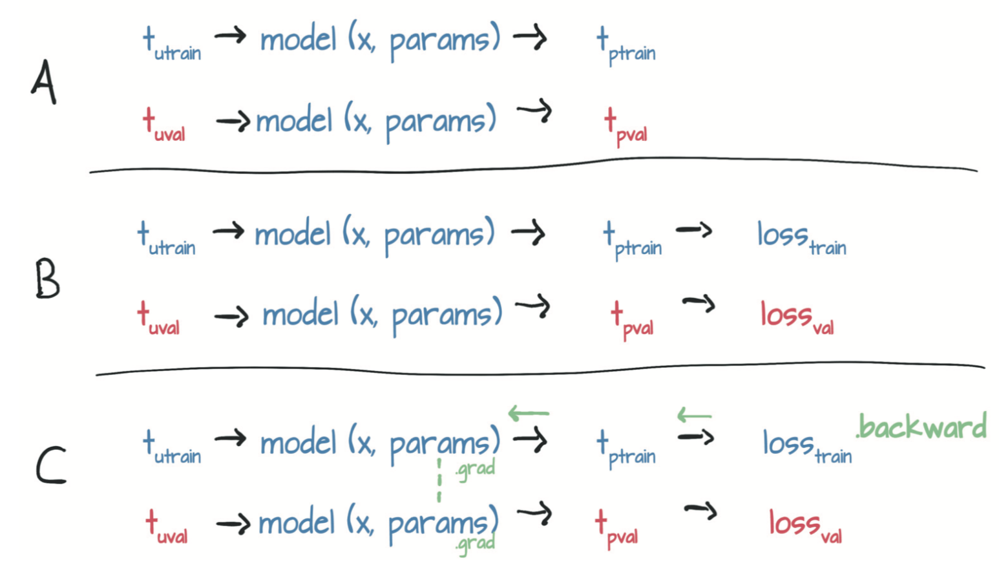

图4.14 本图显示了如果计算图有两个损失，对其中一个调用`.backward`时梯度如何在计算图中传播


这两个图唯一的共同点是参数。当在train_loss上调用backward时，backward函数将在第一个图上运行。换句话说，你是基于train_t_u来累积train_loss相对于参数的导数的。

如果你还（错误地）对val_loss调用了backward，那么你将在相同叶节点上累积val_loss相对于参数的导数值。还记得zero_grad吗，除非你明确地将梯度清零，否则每次调用backward时，梯度都会进行累积？这里就会发生类似的事情：对val_loss调用backward会导致梯度累积在trainsloss.backward()执行期间生成的梯度之上。此时，你将在整个数据集（训练集加上验证集）上有效地训练模型，因为梯度将取决于两者。真是有趣。

还有一个点需要讨论：因为你永远不会对val_loss调用backward，所以为什么要构建图形？实际上，此时你完全可以将model和loss_fn当作普通函数而无需追踪计算历史。无论经过怎样的优化，追踪计算历史都会带来额外的代价，所以你应该在验证过程中避免这些代价，尤其是当模型具有数百万个参数时。

为了解决这个问题，PyTorch允许你通过使用torch.no_grad上下文管理器在不需要时关闭autograd。虽然就小规模问题而言，在速度或内存消耗方面没有任何有意义的优势。但是对于较大的问题，差别可能会很明显。你可以通过检查val_loss张量上require_grad属性的值来确保此上下文管理器正常工作：

In [108]:
def training_loop(n_epochs, optimizer, params, 
                  train_t_u, val_t_u, train_t_c, val_t_c):
    for epoch in range(1, n_epochs + 1):
        train_t_p = model(train_t_u, *params)
        train_loss = loss_fn(train_t_p, train_t_c)

        with torch.no_grad():
            val_t_p = model(val_t_u, *params)
            val_loss = loss_fn(val_t_p, val_t_c)
            assert val_loss.requires_grad == False

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

使用相关的set_grad_enabled上下文管理器，你还可以根据布尔表达式（通常表示在训练还是在推理中）来调节代码在启用或禁用autograd的情况下运行。你可以定义一个calc_forward函数，该函数接受输入中的数据，并根据布尔值is_train参数运行带或不带autograd的model和loss_fn：

In [109]:
def calc_forward(t_u, t_c, is_train):
    with torch.set_grad_enabled(is_train):
        t_p = model(t_u, *params)
        loss = loss_fn(t_p, t_c)
    return loss

## 5.1 神经元

深度学习的核心是神经网络，即能够通过简单函数的组合来表示复杂函数的数学实体。神经网络这个词显然暗示了与人脑工作方式的联系。事实上，尽管[最初的神经网络模型是受神经科学启发的](http://psycnet.apa.org/doiLanding?doi=10.1037%2Fh0042519)，但现代人工神经网络与大脑中神经元的机制仅有略微的相似之处。人工和生理（physiological）神经网络似乎使用的是略微相似的数学策略来近似复杂的函数，因为这种策略很有效。

> 注：从现在开始，我们将省略“人工”并简称为神经网络。

这些复杂函数的基本组成单元是神经元，如图5.2所示。从本质上讲，神经元不过是输入的线性变换（例如，输入乘以一个数[weight，权重]，再加上一个常数[偏置，bias]），然后再经过一个固定的非线性函数（称为激活函数）。

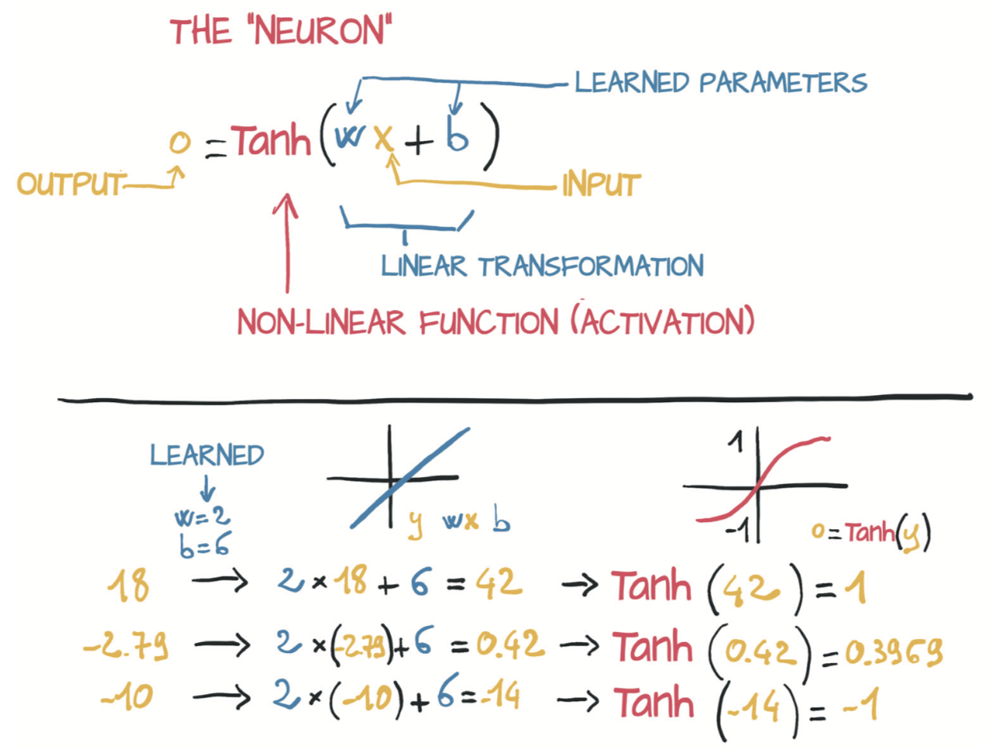

数学上，你可以将其写为 $o = f(wx + b)$，其中 $x$ 为输入，$w$ 为权重或缩放因子，$b$ 为偏置或偏移。$f$ 是激活函数，在此处设置为双曲正切（ tanh）函数。通常，$x$ 以及 $o$ 可以是简单的标量，也可以是向量（包含许多标量值）。类似地，$w$ 可以是单个标量或矩阵，而 $b$ 是标量或向量（输入和权重的维度必须匹配）。在后一种情况下，该表达式被称为神经元层，因为它通过多维度的权重和偏差表示许多神经元。

如图5.3所示的多层神经网络例子由下面的函数组成：

$$
x_1 = f(w_0  x + b_0) \\
x_2 = f(w_1  x_1 + b_1) \\
... \\
y = f(w_n  x_n + b_n) \\
$$

其中神经元层的输出将用作下一层的输入。请记住，这里的 $w_0$ 是一个矩阵，而 $x$ 是一个向量！在此使用向量可使 $w_0$ 容纳整个神经元层，而不仅仅是单个权重。

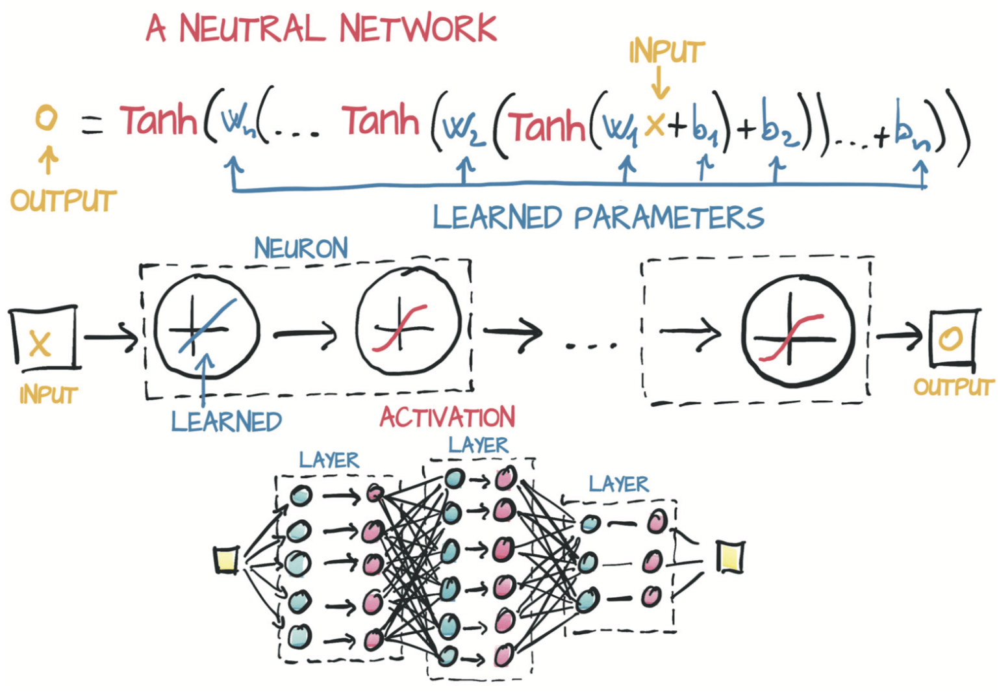

之前的线性模型与你将要使用的深度学习模型之间的重要区别是误差函数的形状。线性模型和误差平方损失函数具有凸的具有明确定义的最小值的误差曲线。如果你要使用其他方法（译者注：即非梯度下降的方法），则可以自动地求出这个明确的最小值。而（译者注：使用梯度下降）参数更新则试图尽可能地估计出这个最小值。

即使使用相同的误差平方损失函数，神经网络也不具有凸误差曲面这个属性。你尝试优化的每个参数都没有一个明确正确的答案。相反，你尝试优化所有协同工作的参数以产生有用的输出。由于有用的输出只会逼近真实值，因此会有一定程度的不完美。这种不完美在何处以及如何表现是任意的，引起这种不完美的控制输出的参数在某种程度上也是任意的。从机械角度来看，神经网络训练的输出结果看起来很像参数估计，但是请记住，理论基础是完全不同的。

神经网络具有非凸误差曲面主要是因为激活函数。组合神经元来逼近各种复杂函数的能力取决于每个神经元固有的线性和非线性行为的组合。



## 5.1.1 你所需的只是激活函数

（深度）神经网络中最简单的单元是线性运算（缩放+偏移）然后紧跟一个激活函数。在你的上一个模型中有一个线性运算，而这个线性运算就是整个模型。激活函数的作用是将先前线性运算的输出聚集到给定范围内。

假设你正在为图片是否是“狗”打分。猎犬和西班牙猎狗的照片应该评分很高；飞机和垃圾车的图像应得分较低。熊的图片也应具有较低的分数，尽管比垃圾车的分数高。

问题是你必须定义何为高分。因为可以使用float32的全部范围，所以高分可以达到很高。即使你说“这是10分制”，有时模型也会在 $11/10$ 分。请记住，在模型内部，这都是 $w x + b$ 矩阵乘法的求和结果，所以自然不会将自己限制在特定的输出范围内。

你需要做的就是将线性操作的输出严格限制在特定范围内，以便该模型输出的使用者不必处理（得分为） $12/10$ 的幼犬，$-10$ 的熊以及 $-1000$ 的垃圾车。

一种可能的解决办法是截断输出值。小于0的任何值都将设置为0，而10以上的任何值都将设置为10。你可以使用一个简单的激活函数[`torch.nn.Hardtanh`](https://pytorch.org/docs/stable/nn.html#hardtanh)，它默认将输出值截断在 $[-1,1]$ 内。

另一个运作良好的函数族是`torch.nn.Sigmoid`（即 $1 / (1 + e ^ {-x})$），`torch.tanh`和稍后会看到的其他函数。这些函数的曲线随着 $x$ 趋于负无穷大而渐近地接近 $0$ 或 $-1$，随着 $x$ 的增加而接近 $1$，并且在 $x = 0$ 时具有大致恒定的斜率。从概念上讲，以这种方式形成的函数可以很好地工作，因为这意味着神经元（即线性函数紧跟着激活函数）将对线性函数输出中间的区域敏感，而其区域都集中在边界值旁边。如图5.4所示，垃圾车的得分为-0.97，而熊、狐狸和狼的得分可能在-0.3到0.3之间。

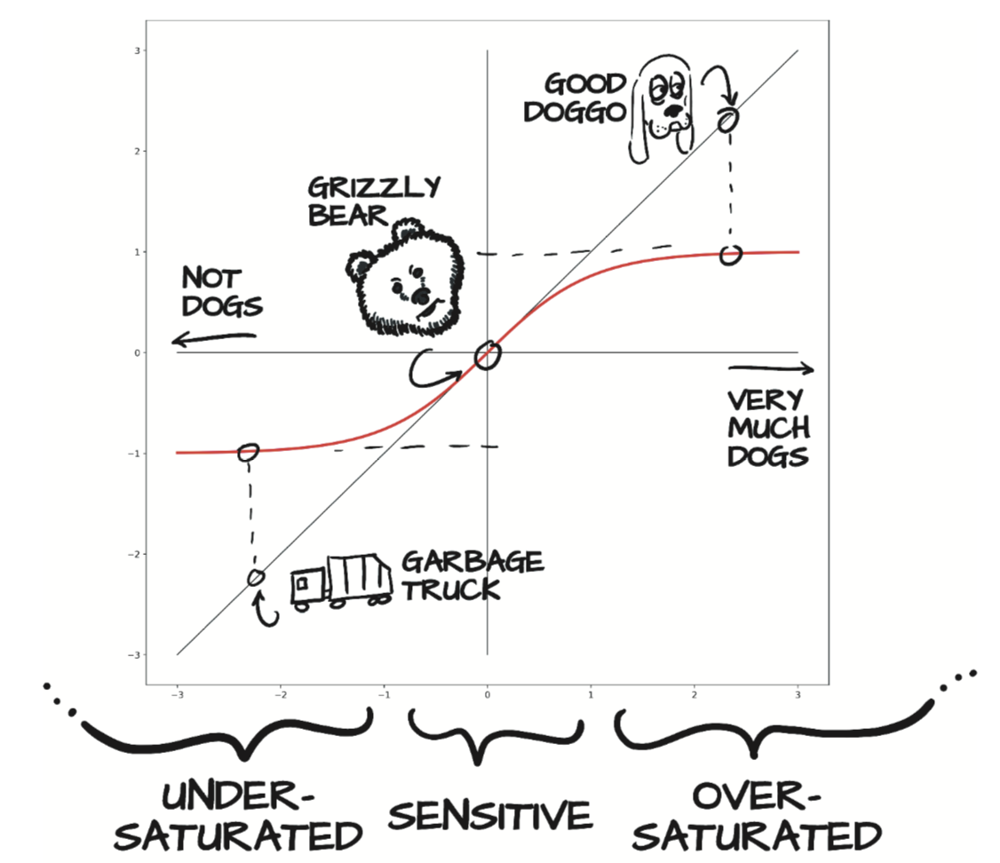

垃圾车被标记为“不是狗”，好狗映射为“显然是狗”，而熊最终停在中间。在代码中，你将看到确切的值：

``` python
>>> import math
>>> math.tanh(-2.2) # 垃圾车
-0.9757431300314515
>>> math.tanh(0.1)  # 熊
0.09966799462495582
>>> math.tanh(2.5)  # 狗
0.9866142981514303
```

熊处于敏感范围内，因此熊的微小变化会导致结果发生明显变化。你可以从灰熊换成北极熊（北极熊的脸庞似地更像传统犬），此时当你向“very much a dog”滑动时当看到Y轴上的跳跃。相反，考拉熊会减少与狗的相似度，然后激活输出就会下降。不过，你很难对垃圾车做些改变使其更像狗，即使你对其做出了了巨大的改变，你也可能只会看到从-0.97提升到-0.8左右。

存在许多激活函数，其中一些如图5.5所示。在第一列中，你将看到连续函数`Tanh`和`Softplus`。第二列是它左侧激活函数的“硬”版本，即`Hardtanh`和`ReLU`。`ReLU`（Rectified Linear Unit，线性整流单元）值得特别注意，因为它被认为是性能最好的常用激活函数之一，因为许多最新的结果都使用了它。`Sigmoid`激活函数（也称为逻辑函数）在早期的深度学习工作中得到了广泛的使用，但已不常用。最后，`LeakyReLU`函数将标准`ReLU`修改为在负输入时具有小的正斜率（该斜率通常为0.01，但为清楚起见，此处显示的斜率为0.1）而不是严格为零。

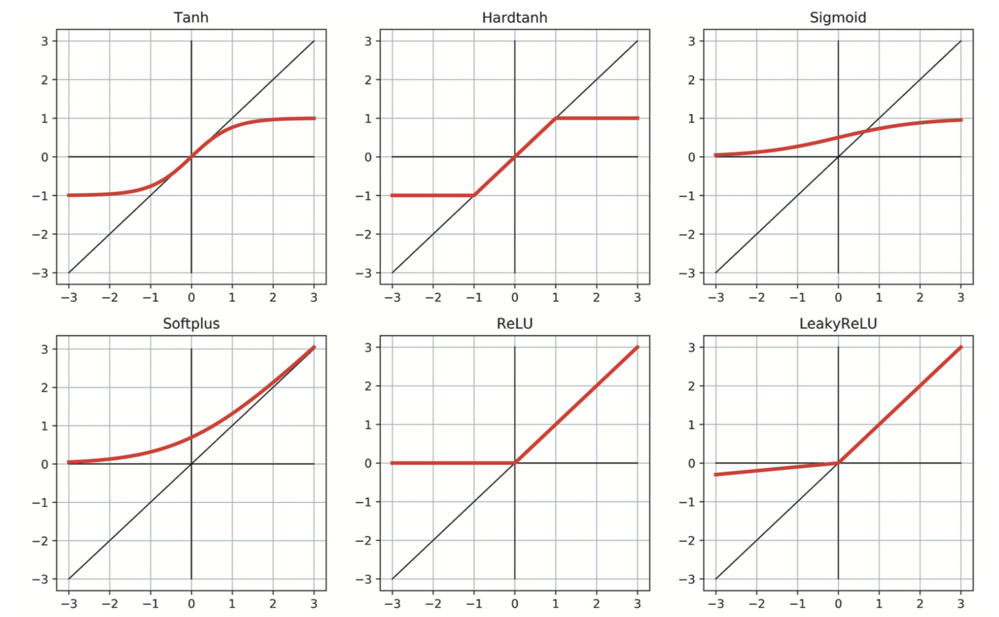

激活函数很好奇，因为我们使用了如此众多成功的激活函数（比图5.5中展示的多得多），很明显我们对激活函数几乎没有严格的要求。因此，我们将讨论有关激活函数的一些一般性，这些一般性不是总是正确的。也就是说，根据定义，激活函数

* 是非线性的。在没有激活函数的情况下重复应用 $w x + b$ 会产生多项式。非线性的激活函数允许整个网络能近似更复杂的函数。
* 是可微的。激活函数是可微的这样就可以计算穿过它们的梯度。不可微的离散点是无伤大雅的，例如`Hardtanh`和`ReLU`。

> [当然上述陈述不总是正确的。](https://openai.com/blog/nonlinear-computation-in-linear-networks/)

如果没有上述两个要求，网络要么退回到复杂的多项式，要么变得难以训练。

激活函数还通常（尽管并非总是如此）

* 具有至少一个敏感范围，其中输入的轻微变化会导致输出中相应的变化。
* 具有至少一个不敏感（或饱和）范围，其中输入的变化导致输出的变化很小甚至没有变化。

举例来说，由于结合了具有不同权重和输入偏差的敏感范围，因此`Hardtanh`函数可以轻松地用于函数的分段线性近似。

通常（但并非普遍如此），激活函数至少具有以下特点之一：
* 当输入变为负无穷大时接近（或达到）下限
* 当输入变为正无穷大时接近（或达到）上限

思考一下反向传播的工作原理，你可以发现，当输入处于响应范围内时，误差将通过激活更有效地向后传播，而误差不会严重影响输入饱和的神经元（因为由于输出周围区域很平坦，梯度将接近零）。

综上所述，此机制非常强大。我们要说的是，在由线性+激活单元构成的网络中，当向网络提供不同的输入时，(a)不同的单元对于相同的输入会在不同的范围内做出响应，并且(b)与这些输入相关的误差将主要影响在敏感范围内运行的神经元，而其他单元或多或少不受学习过程的影响。此外，由于激活函数相对于其输入的导数通常在敏感范围内接近1，因此通过梯度下降在该范围内估计线性变换的参数看起来很像线性拟合。

你开始对如何将多个线性+激活函数并行连接并一个接一个地堆叠到一个能够近似复杂函数的数学对象上有了更深入的了解。不同的组合会响应不同范围内的输入，并且对于这些参数，通过梯度下降相对容易优化，因为学习过程将非常类似于线性拟合，直到输出饱和为止。

## 5.1.2 对神经网络来说学习的意义

从一系列线性变换紧跟可微激活函数中可以构建出能近似高度非线性过程的模型，且可以通过梯度下降很好地估计出其参数。即使处理的是具有数百万个参数的模型，这一事实仍然成立。使用深度神经网络之所以如此吸引人，是因为它使你不必担心表示数据的确切函数（无论是二次多项式，分段多项式还是其他函数）。使用深度神经网络模型，你将获得通用的估计器和估算其参数的方法。根据模型容量及其对复杂的输入/输出关系进行建模的能力，通过组装简单的构建模块，你可以定制这个估计器。图5.6显示了一些示例。

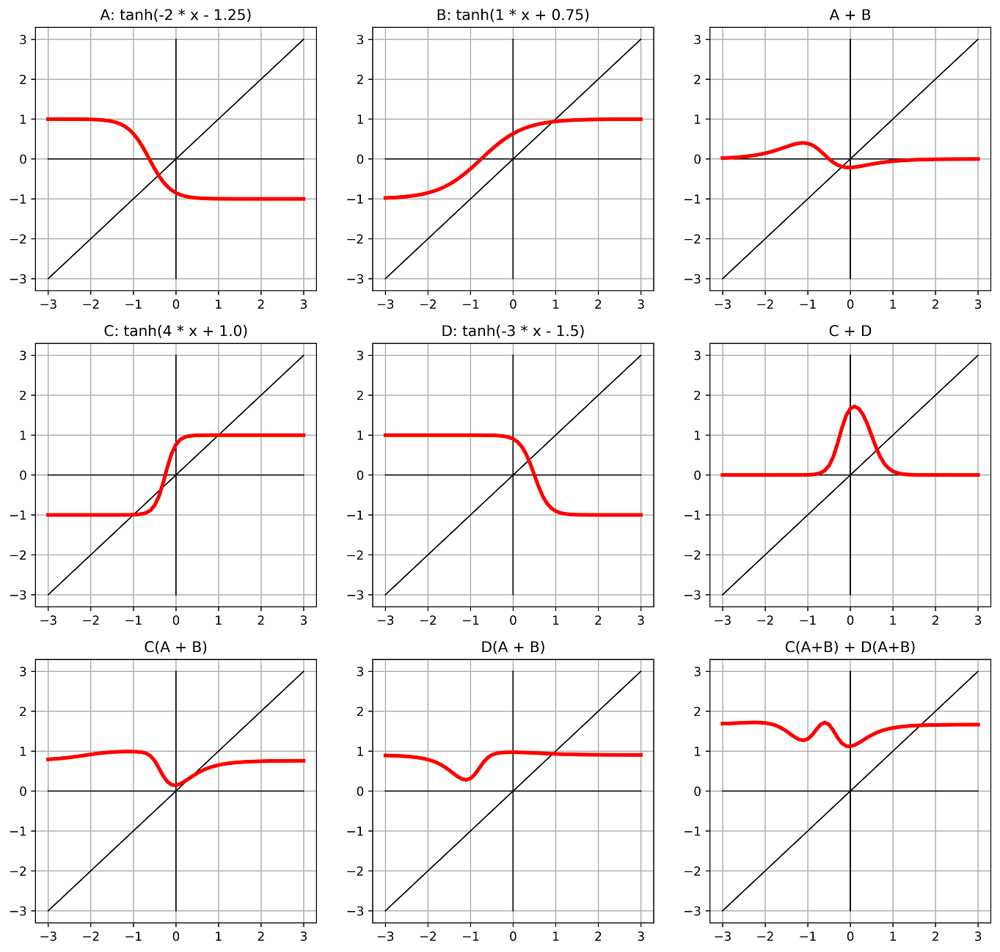

左上方的四个图显示了四个神经元A、B、C和D，每个都有自己的（任意选择的）权重和偏差。每个神经元都使用Tanh激活函数，其输出最小为-1，最大为1。不同的权重和偏差会移动中心点，并改变从最小值到最大值过渡的剧烈程度，但是显然它们的形状都是大致相同的。右边的一列显示了合在一起的两对神经元（A+B和C+D）。这里，你开始看到一些模仿单层神经元的有趣属性。A+B显示出一条轻微的S曲线，其极值趋近于零，但正负都在中间。相反，C+D仅具有较大的正凸点，其峰值比单神经元最大值1高。

在第三行中，你开始组合神经元，就像它们在两层网络中一样。C(A+B)和D(A+B)都具有与A+B相同的正负凸点，但是正峰值更加微弱。C(A+B)+D(A+B)的成分显示出一个新特性：两个清晰的负凸点，以及在主要关注区域左侧可能还有一个细微的第二个正峰。所有这一切发生在两层中只有四个神经元的情况下！

再此提一下，选择这些神经元的参数只是为了产生视觉上有趣的结果。训练包括找到这些权重和偏差的可接受值，以使所得网络正确执行一项任务，例如根据给定的地理坐标和一年中的时间预测可能的温度。成功地执行任务的意思是在未见过的数据上获得正确的输出，这些未见过的数据的产生过程与训练数据是相同的。一个成功训练后的网络，通过其权重和偏差的值，能够捕获表示成有意义数字的数据的内在结构，这些数字表示形式对刚刚说的未见过的数据也适用。

这是你实现学习机制的又一步：深度神经网络可让你近似高度非线性的过程，而无需为它们建立明确的模型。 相反，从未经训练的通用模型开始，你可以通过为它提供一组输入和输出以及一个从中进行反向传播的损失函数，将其专门用于某个任务。通过训练样本将通用模型专门用于某个任务就是我们所谓的学习，因为模型并不是在考虑特定任务的情况下构建的；模型中没有编码描述该任务如何工作的规则。

根据之前温度计的经验，你假设两个温度计都是线性测量温度的。这个假设就是我们为任务隐式编码的地方：我们对输入/输出函数的形状进行了硬编码；我们无法近似除了围绕一条线的数据点外的数据。随着问题的维数增长（许多输入到许多输出）以及输入/输出关系变得复杂，假设输入/输出函数的形状变得不太可能。物理学家或应用数学家的工作通常是根据理论原理对现象进行函数描述，以便可以通过测量来估算未知参数并获得准确的模型。而另一方面，深度神经网络是一系列函数，可以近似各种输入/输出关系，而不必要求提供一种现象的解释模型。在某种程度上，你需要放弃可解释性来解决日益复杂的问题。换句话说，有时您缺乏能力、信息或者计算资源来为你遇到的问题建立显式模型，因此数据驱动方法是你前进的唯一方法。

## 5.2 PyTorch的nn模块

之前这些关于神经网络的讨论可能会让你对使用PyTorch从头开始构建一个神经网络感到好奇。第一步是用神经网络模型替换之前的线性模型。从正确性的角度来看，此步骤是一个毫无用处的步骤，因为你已经验证了本任务只需要线性函数，但是对于从一个很简单的问题开始然后进行扩展来说仍然是有用的。

PyTorch有一个专门用于神经网络的完整子模块：`torch.nn`。该子模块包含创建各种神经网络体系结构所需的构建块。这些构建块在PyTorch术语中称为module（模块），在其他框架中称为layer（层）。

PyTorch模块都是从基类`nn.Module`继承而来的Python类。模块可以具有一个或多个参数（`Parameter`）实例作为属性，这些参数就是在训练过程中需要优化的张量（在之前的线性模型中即w和b）。模块还可以具有一个或多个子模块（`nn.Module`的子类）属性，并且也可以追踪其参数。

> 注：子模块必须是顶级属性（top-level attributes），而不能包含在list或dict实例中！否则，优化器将无法找到子模块（及其参数）。对于需要子模块列表或字典的情况，PyTorch提供有`nn.ModuleList`和`nn.ModuleDict`。

你可以毫不奇怪地可以找到一个名为`nn.Linear`的`nn.Module`子类，它对其输入进行仿射变换（通过参数属性weight和bias）；它就相当于之前在温度计实验中实现的方法。现在，从上次中断的地方开始，将之前的代码转换为使用`nn`的形式。

所有PyTorch提供的`nn.Module`子类都定义了其调用方法，使你可以实例化`nn.Linear`并将其像一个函数一样进行调用，如下面的代码所示：

``` python
import torch.nn as nn

linear_model = nn.Linear(1, 1) # 参数: input size, output size, bias(默认True)
linear_model(t_un_val)
```
输出:
```
tensor([[1.2665],
        [1.0006]], grad_fn=<AddmmBackward>)
```

In [110]:
# 注：书中这里的代码有误，下面举了一个例子，形象理解即可

import torch.nn as nn

linear_model = nn.Linear(1, 1) # 参数: input size, output size, bias(默认True)
a = torch.tensor([[1.], [1.], [2.]], requires_grad = True)
linear_model(a)

tensor([[0.0072],
        [0.0072],
        [0.7552]], grad_fn=<AddmmBackward>)

使用一组参数调用`nn.Module`实例最终会调用带有相同参数的名为`forward`的方法，`forward`方法会执行前向传播计算；不过在调用之前和之后还会执行其他相当重要的操作。因此，虽然从技术上讲直接调用`forward`是可行的，并且它产生的结果与调用`nn.Module`实例相同，但用户不应该这样做：
``` python
>>> y = model(x)
>>> y = model.forward(x) # 不要这样做!!!
```

以下代码显示了`Module.call`的实现（为清楚起见进行了一些简化）:
``` python
def __call__(self, *input, **kwargs):
    for hook in self._forward_pre_hooks.values():
        hook(self, input)
    result = self.forward(*input, **kwargs)
    for hook in self._forward_hooks.values():
        hook_result = hook(self, input, result)
        # ...
    for hook in self._backward_hooks.values():
        # ...
    return result
```

如上所示，如果直接使用`.forward（...）`，很多`hook`将无法正确调用。

现在回到线性模型。`nn.Linear`的构造函数接受三个参数：输入特征的数量，输出特征的数量以及线性模型是否包含偏差（此处默认为True）。

这里特征的数量是指输入和输出张量的尺寸，因此本例是1和1。例如，如果在输入中同时使用了温度和气压，则在其中输入具有两个特征输入和而输出只有一个特征。如你所见，对于具有多个中间模块的更复杂的模型，模型的容量与特征的数量有关。

现在你有一个具有一个输入和一个输出特征的`nn.Linear`实例，它需要一个权重

In [111]:
linear_model.weight

Parameter containing:
tensor([[0.7479]], requires_grad=True)

和一个偏差：

In [112]:
linear_model.bias

Parameter containing:
tensor([-0.7407], requires_grad=True)

你可以用一些输入来调用这个模块：

``` python
x = torch.ones(1)
linear_model(x)
```
输出:
```
tensor([0.6871], grad_fn=<AddBackward0>)
```

在上面的代码中，你没有提供正确尺寸的输入（尽管还是产生了输出）。你有一个可以接受一个输入并产生一个输出的模型，但是PyTorch的`nn.Module`及其子类被设计为可以同时处理多个样本。为了容纳多个样本，模型希望输入的第0维为这个批次中的样本数目。

`nn`中的任何模块都被编写成同时产生一个批次（即多个输入）的输出。 因此，假设你需要对10个样本运行`nn.Linear`，则可以创建大小为 B x Nin 的输入张量，其中 B 是批次的大小，而 Nin 是输入特征的数量，然后在模型中同时运行：

In [113]:
x = torch.ones(10, 1)
linear_model(x)

tensor([[0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072],
        [0.0072]], grad_fn=<AddmmBackward>)

图5.7显示了批处理图像数据的类似的情况。输入尺寸为 BxCxHxW，其中批处理大小（batch size）B为3（狗、鸟和汽车的图像），每张图像通道数C为3（红色，绿色和蓝色），高度 H 和宽度 W 的像素数未指定。

正如你所看到的，输出是大小为 B x Nout 的张量，其中 Nout 是输出特征的数量——在此例中为四个。

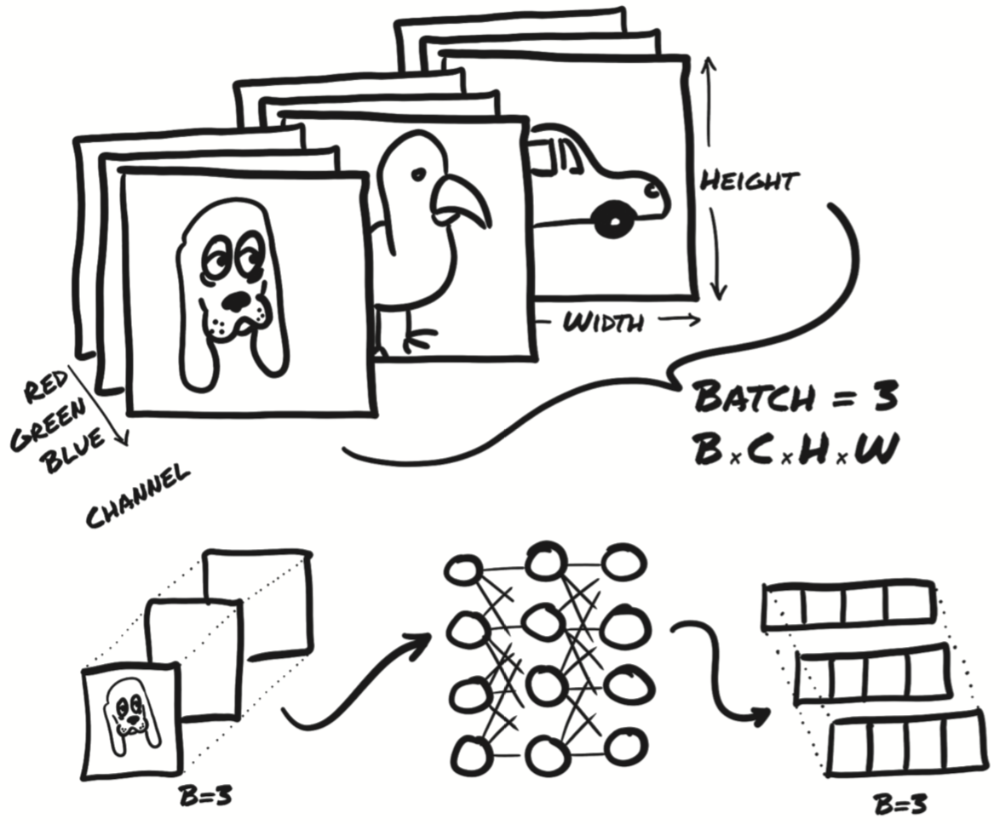

我们要进行此批处理的原因是多方面的。一个主要动机是确保我们所需的计算量足够大，以使我们充分利用执行计算的计算资源。特别地，GPU是高度并行化的，因此在小型模型上的单个输入将使大多数计算单元处于空闲状态。通过提供成批的输入，可以将计算分散到其他闲置的计算单元上，这意味着成批的结果就像单个结果一样能够很快地返回。另一个好处是，某些高级模型将使用整个批次的统计信息，而当批次大小较大时那些统计数据将变得更准确。

现在回到温度计数据。`t_u`和`t_c`是两个大小为B的一维张量。由于广播机制，你可以将线性模型写为 $w x + b$，其中 $w$ 和 $b$ 是两个标量参数。该模型之所以有效，是因为你具有一个输入特征；如果你有两个，则需要添加额外的尺寸以将该1D张量转变为矩阵，该矩阵每一行代表每个样本，每列代表所有样本的某个特征。

这就是你要切换到使用`nn.Linear`所要做的。你需要将尺寸为 B 的输入reshape为 B x Nin，其中Nin为1。你可以使用`unsqueeze`轻松地做到这一点：

In [114]:
t_c = [0.5,  14.0, 15.0, 28.0, 11.0,  8.0,  3.0, -4.0,  6.0, 13.0, 21.0]
t_u = [35.7, 55.9, 58.2, 81.9, 56.3, 48.9, 33.9, 21.8, 48.4, 60.4, 68.4]
t_c = torch.tensor(t_c).unsqueeze(1) # <1>
t_u = torch.tensor(t_u).unsqueeze(1) # <1>

t_u.shape

torch.Size([11, 1])

你完成了。现在更新原来的训练代码。首先，将之前的手工模型替换为`nn.Linear(1,1)`，然后将线性模型参数传递给优化器：

In [115]:
linear_model = nn.Linear(1, 1)
optimizer = optim.SGD(
    linear_model.parameters(),
    lr=1e-2)

In [116]:
linear_model.parameters()

<generator object Module.parameters at 0x0000026103BAB2E0>

In [117]:
list(linear_model.parameters())


[Parameter containing:
 tensor([[0.1299]], requires_grad=True),
 Parameter containing:
 tensor([0.6182], requires_grad=True)]

此调用递归调用到模块的`init`构造函数中定义的子模块中，并返回遇到的所有参数的列表，因此你可以像之前一样方便地将其传递给优化器构造函数。

你现在已经可以指出训练循环中会发生什么了。我们为优化器提供了一个`require_grad = True`张量列表。所有参数都是用这种方式定义的，因为它们需要通过梯度下降进行优化。调用`raining_loss.backward()`时，`grad`将累积在图的叶节点上，这些节点正是传递给优化器的参数。

此时，SGD优化器已具有所需的一切。调用`optimizer.step()`时，它将循环访问每个参数，并按与存储在其grad属性中的值成比例的量对其进行更改。

现在我们来看看训练循环：

In [118]:
def training_loop(n_epochs, optimizer, model, loss_fn, 
                  t_u_train, t_u_val, t_c_train, t_c_val):
    for epoch in range(1, n_epochs + 1):
        t_p_train = model(t_un_train)
        loss_train = loss_fn(t_p_train, t_c_train)

        t_p_val = model(t_un_val)
        loss_val = loss_fn(t_p_val, t_c_val)

        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()

        if epoch == 1 or epoch % 1000 == 0:
            print('Epoch %d, Training loss %.4f, Validation loss %.4f' % (
                    epoch, float(loss_train), float(loss_val)))

此调用递归调用到模块的`init`构造函数中定义的子模块中，并返回遇到的所有参数的列表，因此你可以像之前一样方便地将其传递给优化器构造函数。

你现在已经可以指出训练循环中会发生什么了。我们为优化器提供了一个`require_grad = True`张量列表。所有参数都是用这种方式定义的，因为它们需要通过梯度下降进行优化。调用`raining_loss.backward()`时，`grad`将累积在图的叶节点上，这些节点正是传递给优化器的参数。

此时，SGD优化器已具有所需的一切。调用`optimizer.step()`时，它将循环访问每个参数，并按与存储在其grad属性中的值成比例的量对其进行更改。

现在我们来看看训练循环：

注：此部分部分代码有误，意会即可

```python
def training_loop(n_epochs, optimizer, model, loss_fn, 
                  t_u_train, t_u_val, t_c_train, t_c_val):
    for epoch in range(1, n_epochs + 1):
        t_p_train = model(t_un_train)
        loss_train = loss_fn(t_p_train, t_c_train)

        t_p_val = model(t_un_val)
        loss_val = loss_fn(t_p_val, t_c_val)

        optimizer.zero_grad()
        loss_train.backward()
        optimizer.step()

        if epoch == 1 or epoch % 1000 == 0:
            print('Epoch %d, Training loss %.4f, Validation loss %.4f' % (
                    epoch, float(loss_train), float(loss_val)))
```

训练循环几乎没有改变，除了现在你不再明确地将`params`传递给`model`，因为`model`本身在内部保存有`Parameters`。

你还可以使用`torch.nn`的最后一部分：损失函数。实际上，`nn`具有几个常见的损失函数，其中`nn.MSELoss`（MSE代表均方误差）正是先前`loss_fn`的定义。`nn`中的损失函数仍然是`nn.Module`的子类，因此我们可以创建一个实例并将其作为函数调用。在本例中，你将摆脱手动定义的`loss_fn`并替换它：

注：此部分书上代码有误
```python
linear_model = nn.Linear(1, 1)
optimizer = optim.SGD(linear_model.parameters(), lr=1e-2)

training_loop(
    n_epochs = 3000,
    optimizer = optimizer,
    model = linear_model,
    loss_fn = nn.MSELoss(), # 不再使用自己定义的loss
    t_u_train = t_un_train,
    t_u_val = t_un_val,
    t_c_train = t_c_train,
    t_c_val = t_c_val)

print()
print(linear_model.weight)
print(linear_model.bias)

```

输入到我们训练循环中的其他所有内容都保持不变。甚至我们的结果也和之前一样。当然，获得相同的结果只是我们所期望的，差异暗示了bug存在于这两种实现之一。

这是一段漫长的旅程，需要要对这二十多行代码进行很多探索。我们希望到现在为止魔术消失了而该工程师登场了。在本章中学习的内容将使你可以拥有自己编写的代码，而不是在事情变得更加复杂只能戳一戳黑匣子。

还差最后一个步骤：用神经网络代替线性模型作为近似函数。正如我们之前所说，使用神经网络不会产生更高质量的模型，因为我们这个温度校准问题背后的过程本质上是线性的。但是，从线性网络到神经网络的跨越是值得的，这样你以后就不会感到迷失了。

接下来我们将重新定义模型，并将所有其他内容（包括损失函数）保持不变。还是构建最简单的神经网络：一个线性模块然后是一个激活函数，最后将输入喂入另一个线性模块。由于历史原因，第一个 线性+激活层 通常称为隐藏层，因为它的输出不会直接观察到，而是会送到输出层。尽管模型的输入和输出均为大小1（一个输入和一个输出特征），但第一个线性模块的输出大小通常大于1。回顾前面关于激活作用的解释，这会使不同的单位对输入的不同范围做出响应，从而增加模型的容量。最后一个线性层获取激活函数的输出，并将它们线性组合以产生输出值。

`nn`提供了一种通过`nn.Sequential`容器串联模块的简单方法：

``` python
seq_model = nn.Sequential(
            nn.Linear(1, 13),
            nn.Tanh(),
            nn.Linear(13, 1))
seq_model
```
输出:
```
Sequential(
  (0): Linear(in_features=1, out_features=13, bias=True)
  (1): Tanh()
  (2): Linear(in_features=13, out_features=1, bias=True)
)
```

得到的模型的输入是作为`nn.Sequential`的参数的第一个模块所指定的输入，然后将中间输出传递给后续模块，并输出最后一个模块返回的输出。该模型将1个输入特征散开为13个隐藏特征，然后将通过`tanh`激活函数，最后将得到的13个数字线性组合为1个输出特征。

调用`model.parameters()`可以得到第一线性模块和第二线性模块中的权重和偏差。在本例中，我们可以通过打印形状来检查参数：
``` python
[param.shape for param in seq_model.parameters()]
```
输出:
```
[torch.Size([13, 1]), torch.Size([13]), torch.Size([1, 13]), torch.Size([1])]
```

这些都是优化器所需的参数张量。同样，在调用`model.backward()`之后，所有参数都将被计算其`grad`，然后优化器会在调用`optimizer.step()`期间更新参数的值，这与之前的线性模型没有太大不同。毕竟这两个模型都是可微分的模型，可以通过梯度下降进行训练。

有关`nn.Modules`参数的一些注意事项：当你检查由几个子模块组成的模型的参数时，可以方便地通过其名称识别参数。这个方法叫做`named_parameters`：

``` python
for name, param in seq_model.named_parameters():
    print(name, param.shape)
```
输出:
```
0.weight torch.Size([13, 1])
0.bias torch.Size([13])
2.weight torch.Size([1, 13])
2.bias torch.Size([1])
```

实际上，`Sequential`中每个模块的名称都是该模块在参数中出现的顺序。有趣的是，`Sequential`还可以接受`OrderedDict`作为参数，这样就可以给`Sequential`的每个模块命名：

> 并非所有版本的Python都明确指定`dict`的迭代顺序，因此我们在这里使用`OrderedDict`来明确层的顺序并强调这个顺序的重要性。

``` python
from collections import OrderedDict

seq_model = nn.Sequential(OrderedDict([
    ('hidden_linear', nn.Linear(1, 8)),
    ('hidden_activation', nn.Tanh()),
    ('output_linear', nn.Linear(8, 1))
]))

seq_model
```
输出:
```
Sequential(
  (hidden_linear): Linear(in_features=1, out_features=8, bias=True)
  (hidden_activation): Tanh()
  (output_linear): Linear(in_features=8, out_features=1, bias=True)
)
```
此代码使你可以允许子模块有更加具有解释性的名称：

``` python
for name, param in seq_model.named_parameters():
    print(name, param.shape)
```
输出:
```
hidden_linear.weight torch.Size([8, 1])
hidden_linear.bias torch.Size([8])
output_linear.weight torch.Size([1, 8])
output_linear.bias torch.Size([1])
```

你还可以通过访问子模块来访问特定的参数，就像它们是属性一样：

``` python
seq_model.output_linear.bias
```
输出:
```
Parameter containing:
tensor([-0.1786], requires_grad=True)
```

与本章开始时一样，该代码对于检查参数或其梯度（例如在训练期间监视梯度）很有用。假设你要打印出隐藏层线性部分的权重的梯度，你可以为新的神经网络模型运行训练循环，然后在最后一个epoch之后查看结果梯度：

``` python
optimizer = optim.SGD(seq_model.parameters(), lr=1e-3) # 为了稳定性调小了梯度

training_loop(
    n_epochs = 5000,
    optimizer = optimizer,
    model = seq_model,
    loss_fn = nn.MSELoss(),
    t_u_train = t_un_train,
    t_u_val = t_un_val,
    t_c_train = t_c_train,
    t_c_val = t_c_val)

print('output', seq_model(t_un_val))
print('answer', t_c_val)
print('hidden', seq_model.hidden_linear.weight.grad)
```
输出:
```
Epoch 1, Training loss 142.5878, Validation loss 439.7242
Epoch 1000, Training loss 4.9129, Validation loss 46.7108
Epoch 2000, Training loss 3.4471, Validation loss 25.7202
Epoch 3000, Training loss 2.8642, Validation loss 16.3709
Epoch 4000, Training loss 2.5688, Validation loss 11.2405
Epoch 5000, Training loss 2.3860, Validation loss 8.0017
output tensor([[24.0087],
        [ 7.7348]], grad_fn=<AddmmBackward>)
answer tensor([[28.],
        [ 8.]])
hidden tensor([[ 0.0207],
        [ 0.0272],
        [-0.0065],
        [ 0.1072],
        [ 0.0060],
        [ 0.0142],
        [ 0.0004],
        [-0.0004]])
```

你还可以在整个数据上评估模型以查看与线性关系之间的差异：

``` python
from matplotlib import pyplot as plt

t_range = torch.arange(20., 90.).unsqueeze(1)

fig = plt.figure(dpi=100)
plt.xlabel("Fahrenheit")
plt.ylabel("Celsius")
plt.plot(t_u.numpy(), t_c.numpy(), 'o')
plt.plot(t_range.numpy(), seq_model(0.1 * t_range).detach().numpy(), 'c-')
plt.plot(t_u.numpy(), seq_model(0.1 * t_u).detach().numpy(), 'kx')
plt.show()
```
上述代码将会输出图5.8。

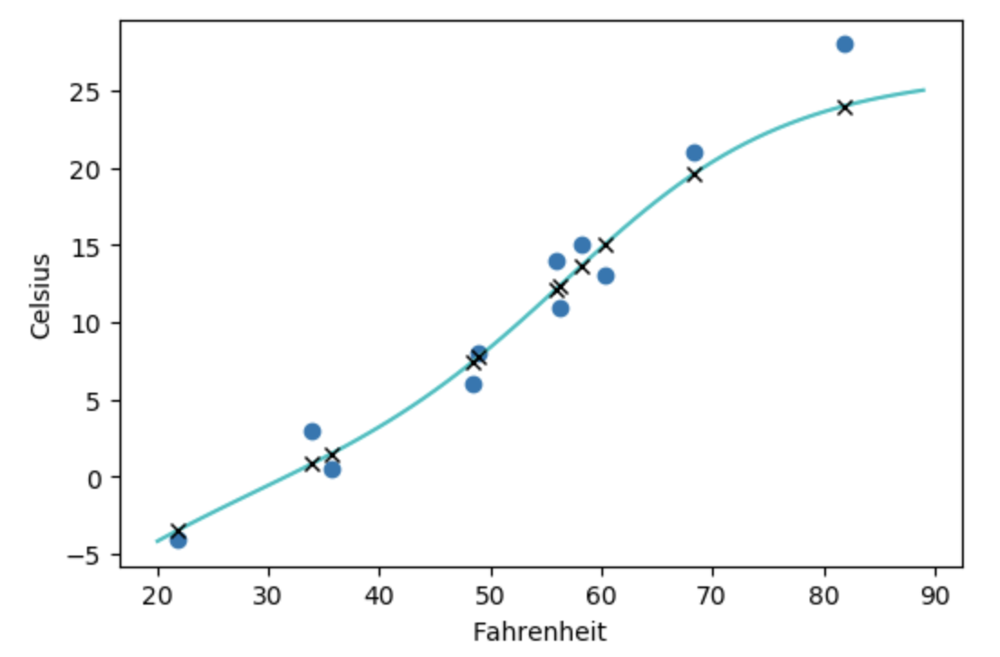

你可能会意识到神经网络有过拟合的趋势，因为它试图拟合包括噪声在内的测量值。不过总体上神经网络表现还不错。

## 5.3 nn的子类

除了`nn.Sequential`类提供的顺序性之外，你不能控制通过网络的数据流向。你可以自己定义`nn.Module`的子类来完全控制输入数据的处理方式：

``` python
class SubclassModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden_linear = nn.Linear(1, 13)
        self.hidden_activation = nn.Tanh()
        self.output_linear = nn.Linear(13, 1)
    def forward(self, input):
        hidden_t = self.hidden_linear(input)
        activated_t = self.hidden_activation(hidden_t)
        output_t = self.output_linear(activated_t)
        return output_t
    
subclass_model = SubclassModel()
subclass_model
```
输出:
```
SubclassModel(
  (hidden_linear): Linear(in_features=1, out_features=13, bias=True)
  (hidden_activation): Tanh()
  (output_linear): Linear(in_features=13, out_features=1, bias=True)
)
```

该代码最终变得更加冗长，因为你必须定义所需的网络层，然后定义在`forward`函数中应如何以及以什么顺序使用这些网络层。这为你在模型中提供了难以置信的灵活性，虽然在本例中你不必要在`forward`函数中执行各种有趣的事情。例如你可以用`activated_t = self.hidden_activation(hidden_t) if random.random() > 0.5 else hidden_t`以一般的概率应用激活函数，尽管这在本例中不太有意义。因为PyTorch使用基于动态图的自动梯度机制，所以无论`random.random()`返回什么，梯度都可以通过有时存在的激活正确地流动！

你通常在模型的构造函数中来定义我们在`forward`函数中需要调用的子模块，以便它们可以在模型的整个生命周期中保存其参数。例如，你可以在构造函数中实例化两个`nn.Linear`实例然后在`forward`中使用它。有趣的是，只要你将`nn.Module`实例分配为模型的属性，就像你在构造函数所做的那样，PyTorch就会自动将该模块登记（register）为子模块，这使模型可以访问其子模块的参数，而无需用户进一步操作。

回到前面的`SubclassModel`，你会看到该类的打印输出类似于具有命名参数的顺序模型`namedseq_model`的打印输出。这是有道理的，因为你使用了相同的名称并打算实现相同的网络结构。如果你查看所有三个模型的参数，也会看到相似之处（除了隐藏神经元数量的差异以外）：
``` python
for type_str, model in [('seq', seq_model), ('namedseq', namedseq_model),
     ('subclass', subclass_model)]:
    print(type_str)
    for name_str, param in model.named_parameters():
        print("{:21} {:19} {}".format(name_str, str(param.shape), param.numel())) 
    print()
```
输出:
```
seq
0.weight              torch.Size([11, 1]) 11
0.bias                torch.Size([11])    11
2.weight              torch.Size([1, 11]) 11
2.bias                torch.Size([1])     1

namedseq
hidden_linear.weight  torch.Size([12, 1]) 12
hidden_linear.bias    torch.Size([12])    12
output_linear.weight  torch.Size([1, 12]) 12
output_linear.bias    torch.Size([1])     1

subclass
hidden_linear.weight  torch.Size([13, 1]) 13
hidden_linear.bias    torch.Size([13])    13
output_linear.weight  torch.Size([1, 13]) 13
output_linear.bias    torch.Size([1])     1
```

此处发生的是：调用`named_parameters()`会深入搜寻构造函数中分配为属性的所有子模块，然后在这些子模块上递归调用`named_parameters()`。无论子模块如何嵌套，任何`nn.Module`实例都可以访问其所有子参数的列表。通过访问将由`autograd`计算出的`grad`属性，优化器就知道如何更新参数以最大程度地减少损失。

> 注：Python列表或dict实例中包含的子模块不会被自动登记！你可以使用[`add_module(name, module)`](https://pytorch.org/docs/stable/nn.html#torch.nn.Module.add_module)方法手动登记这些子模块，或者可以使用`nn.ModuleList`和`nn.ModuleDict`类（它们为包含的实例提供自动登记）。

回顾`SubclassModel`类的实现，并考虑在构造函数中登记子模块以便访问其参数的实用功能，似乎同时登记没有参数的子模块（如`nn.Tanh`）有点浪费，直接在`forward`函数中调用它们难道不是更容易吗？当然可以。

PyTorch的每个`nn`模块都有相应的函数。“函数”一词是指“没有内部状态”或“其输出值完全由输入的参数决定”。实际上，`torch.nn.functional`提供了许多与`nn`模块对应的函数，只是所有模型参数（parameter）都作为了参数（argument）移到了函数调用中。例如，与`nn.Linear`对应的是`nn.functional.linear`，它是一个具有参数`(input, weight, bias=None)`的函数，即模型的权重和偏差是该函数的参数。

回到模型中，继续使用`nn.Linear`模块是有意义的，因为方便`SubclassModel`可以在训练期间管理其所有`Parameter`实例。但你可以安全地切换到`Tanh`的函数版本，因为它没有参数：

``` python
class SubclassFunctionalModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.hidden_linear = nn.Linear(1, 14)
        # 去掉了nn.Tanh()
        self.output_linear = nn.Linear(14, 1)
        
    def forward(self, input):
        hidden_t = self.hidden_linear(input)
        activated_t = torch.tanh(hidden_t) # nn.Tanh对应的函数
        output_t = self.output_linear(activated_t)
        return output_t
    
func_model = SubclassFunctionalModel()
func_model
```
输出:
```
SubclassFunctionalModel(
  (hidden_linear): Linear(in_features=1, out_features=14, bias=True)
  (output_linear): Linear(in_features=14, out_features=1, bias=True)
)
```

这个版本更加简洁（随着模型变得越来越复杂，所需代码行将逐渐累加！），而且完全等同于非函数版本。注意，在构造函数中实例化需要参数进行初始化的模块仍然是有意义的。例如，`HardTanh`使用可选的`min_val`和`max_val`参数，所以你应该创建`HardTanh`实例并重用它而不是在`forward`中重复声明这些参数。

> 小贴士：尽管1.0版的`torch.nn.function`中仍存在诸如`tanh`之类的通用科学函数，但不建议使用这些API，而应使用顶级`torch`命名空间中的API，例如`torch.tanh`。更多其他函数保留在`torch.nn.functional`中。


## 小结

我们在本章讨论了很多内容，虽然我们只是处理了一个简单的问题。我们剖析了可微模型构建，并通过使用梯度下降，先使用原始`autograd`然后依赖`nn`对模型进行训练。至此，你应该对（神经网络）幕后发生的事情充满信心。

我们希望PyTorch这种口味能够符合你的胃口！

## 更多资源

大量书籍和其他资源可用来帮助学习深度学习。 我们推荐以下内容：

* PyTorch官方网站：https://pytorch.org ；
* Andrew W. Traska撰写的[《Grokking Deep Learning》]( https://www.manning.com/books/grokking-deep-learning)是开发强大模型和理解深度神经网络基础机制的重要资源；
* 有关该领域的详尽介绍和参考，我们推荐你进入Ian Goodfellow, Yoshua Bengio和Aaron Courville的[《Deep Learning》](https://www.deeplearningbook.org)；
* 最后但并非最不重要的是，这本书的完整版本现已在Early Access中提供，预计印刷日期为2019年末：https://www.manning.com/books/deep-learning-with-pytorch 。